# June 27 - ConvaeNet Analysis 2

In [29]:
# Imports
import math
import os
import sys
import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from mpl_toolkits.mplot3d import Axes3D

# Add the path to the parent directory to augment search for module
par_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
if par_dir not in sys.path:
    sys.path.append(par_dir)
    
# Import the custom plotting module
from plot_utils import plot_utils
import random
import torch

# Label dict - Dictionary mapping integer labels to str
label_dict = {0:"gamma", 1:"e", 2:"mu"}

In [27]:
# Plot the charge distribution for a given batch
def plot_charge_hist(event, recon, iteration, num_bins=100):
    
    # Flatten the input numpy arrays
    event = event.reshape(-1,1)
    recon = recon.reshape(-1,1)
    
    # Initialize the plot and corresponding parameters
    fig, ax = plt.subplots(figsize=(16,9),facecolor="w")
    ax.tick_params(axis="both", labelsize=20)
    
    # Setup the bins beforehand
    bins = np.linspace(min(np.amin(event),np.amin(recon),1),
                       max(np.amax(event),np.amax(recon)),
                       num_bins)

    # Plot the histograms overlaid
    plt.hist(event, bins, density=False,
             label="actual", color="red",
             alpha=0.5, stacked=True)
    
    plt.hist(recon, bins, density=False,
             label="reconstructed", color="blue",
             alpha=0.5, stacked=True)
    
    # Setup the axes
    ax.set_xlabel("Charge, c", fontsize=20)
    ax.set_ylabel("Number of hits", fontsize=20)
                  
    plt.yscale("log")
    plt.legend(loc="upper right", prop={"size":20})
    plt.title(r"Actual vs Reconstructed charge distribution at iteration = ${0}$".format(iteration)
              ,fontsize=20)
    
    plt.show()

softmaxes shape :  (5000, 3)
labels shape :  (5000,)
predictions shape :  (5000,)
energies shape :  (5000,)


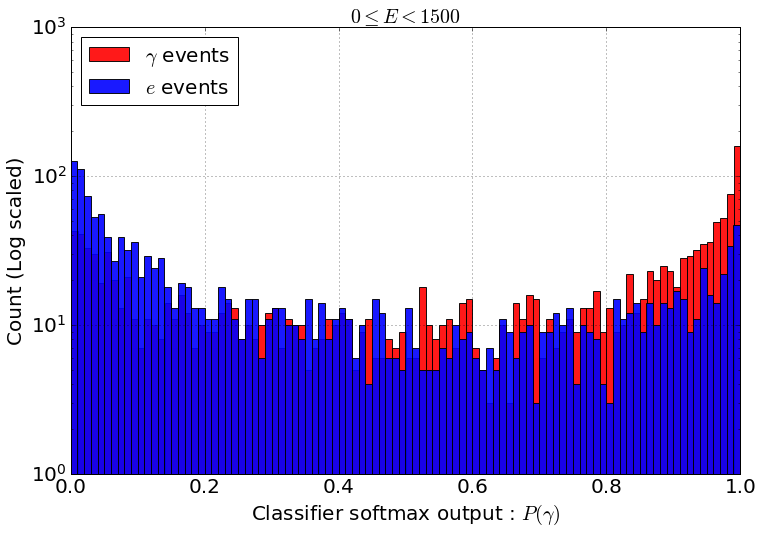

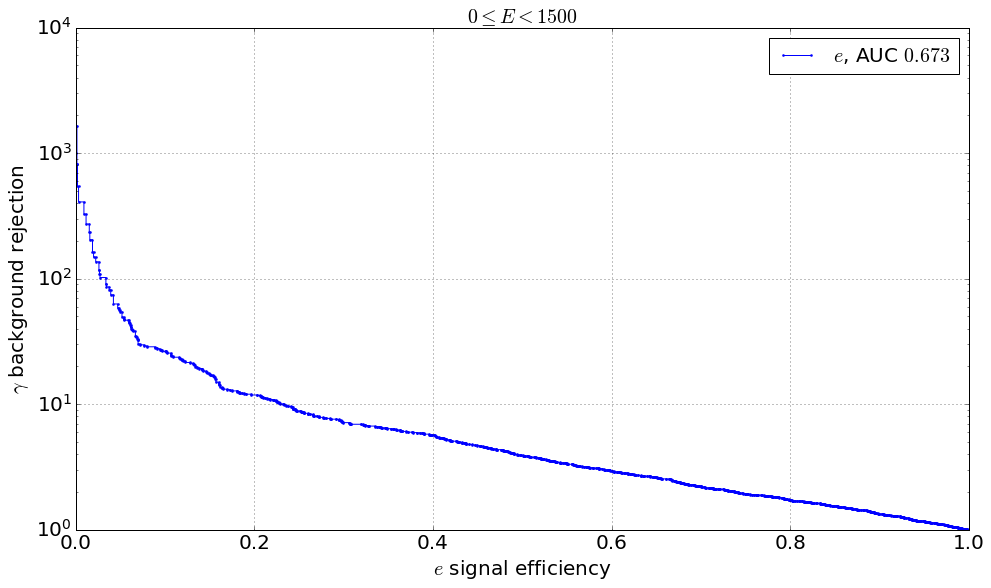

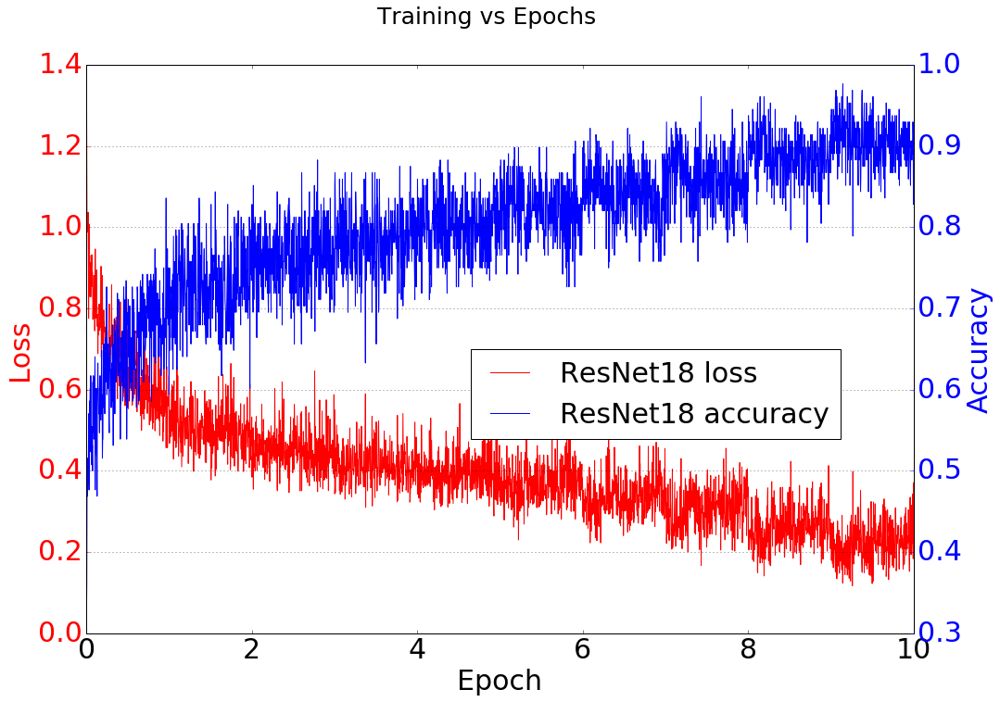

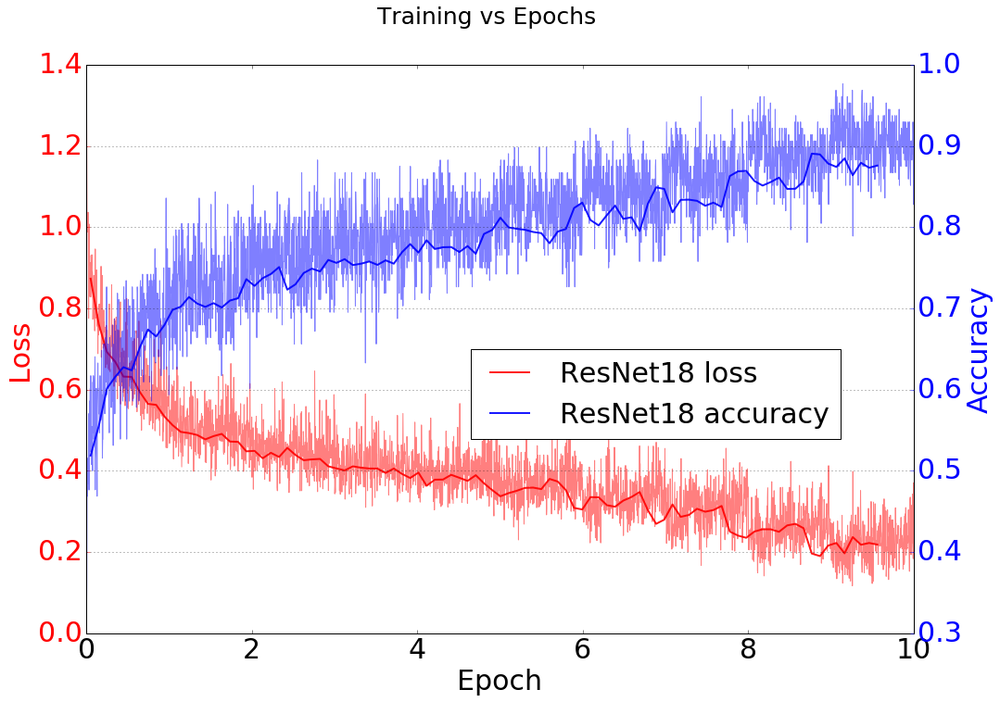

In [2]:
# Using the absolute path
run_id = "20190626_033906"
model_name = "ResNet18"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

# Load the numpy arrays into memory
softmaxes = np.load(dump_dir + "softmax.npy")
labels = np.load(dump_dir + "labels.npy")
predictions = np.load(dump_dir + "predictions.npy")
energies = np.load(dump_dir + "energies.npy")

# Check the shapes of the loaded arrays
print("softmaxes shape : ", softmaxes.shape)
print("labels shape : ", labels.shape)
print("predictions shape : ", predictions.shape)
print("energies shape : ", energies.shape)

# Plot the classifier response curve
plot_utils.plot_classifier_response(softmaxes, labels, energies, 
                                    softmax_index_dict={"gamma":0, "e":1},
                                    event_dict={"gamma":0}, show_plot=True)

# Plot the ROC curve for e vs gamma
plot_utils.plot_ROC_curve_one_vs_one(softmaxes, labels, energies, {"gamma":0, "e":1},
                                     "e", "gamma", show_plot=True)

# Setup the path to the training log file
training_log = dump_dir + "log_train.csv"

# Plot using the downsample intervals
plot_utils.plot_training([training_log], [model_name], {model_name:["red", "blue"]},
                         downsample_interval=32, show_plot=True)

softmaxes shape :  (5000, 3)
labels shape :  (5000,)
predictions shape :  (5000,)
energies shape :  (5000,)


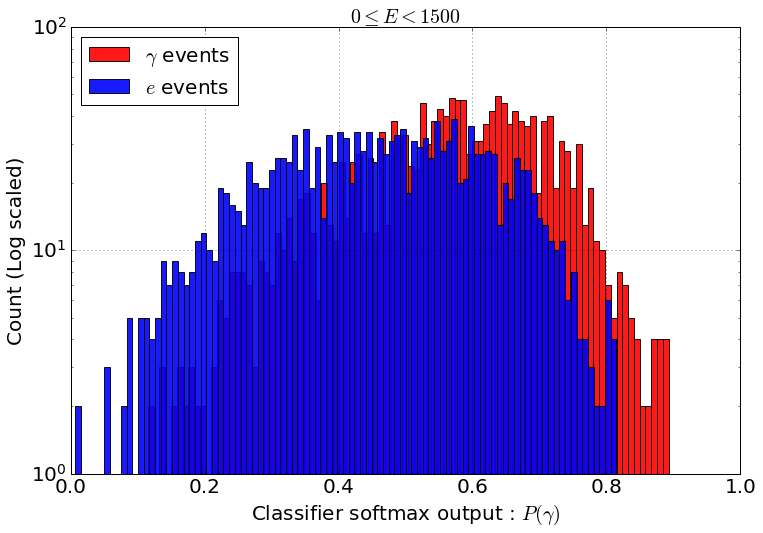

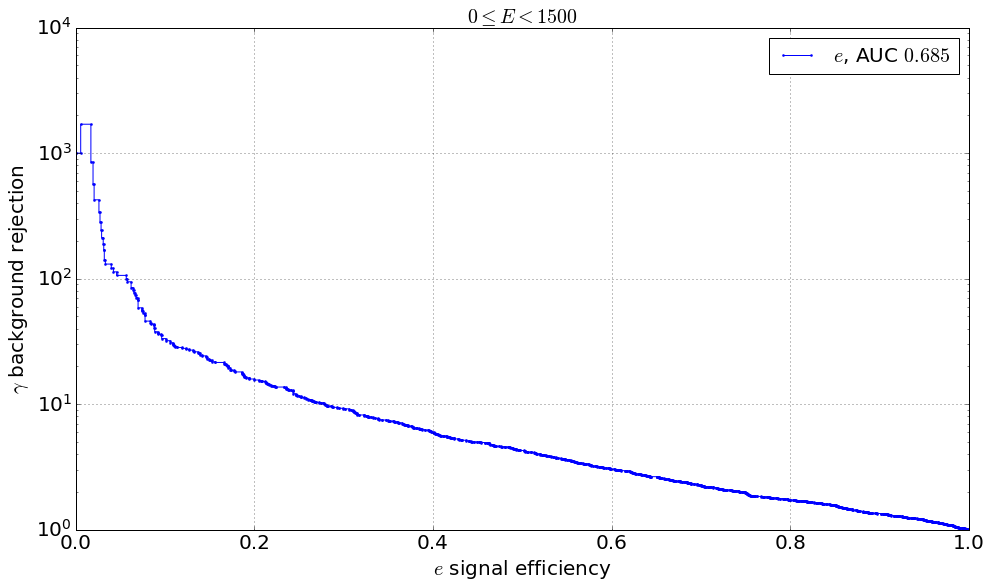

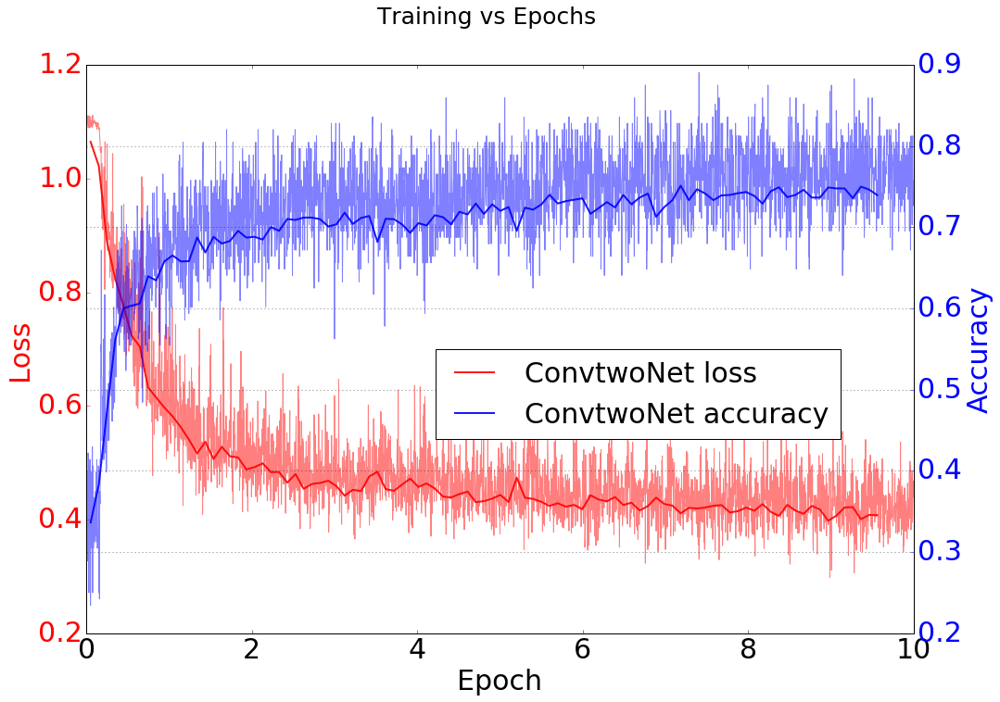

In [4]:
# Using the absolute path
run_id = "20190626_035316"
model_name = "ConvtwoNet"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

# Load the numpy arrays into memory
softmaxes = np.load(dump_dir + "softmax.npy")
labels = np.load(dump_dir + "labels.npy")
predictions = np.load(dump_dir + "predictions.npy")
energies = np.load(dump_dir + "energies.npy")

# Check the shapes of the loaded arrays
print("softmaxes shape : ", softmaxes.shape)
print("labels shape : ", labels.shape)
print("predictions shape : ", predictions.shape)
print("energies shape : ", energies.shape)

# Plot the classifier response curve
plot_utils.plot_classifier_response(softmaxes, labels, energies, 
                                    softmax_index_dict={"gamma":0, "e":1},
                                    event_dict={"gamma":0}, show_plot=True)

# Plot the ROC curve for e vs gamma
plot_utils.plot_ROC_curve_one_vs_one(softmaxes, labels, energies, {"gamma":0, "e":1},
                                     "e", "gamma", show_plot=True)

# Setup the path to the training log file
training_log = dump_dir + "log_train.csv"

# Plot using the downsample intervals
plot_utils.plot_training([training_log], [model_name], {model_name:["red", "blue"]},
                         downsample_interval=32, show_plot=True)

# VAE architectures

# Using KvaeNet as the reference for the new VAE architectures

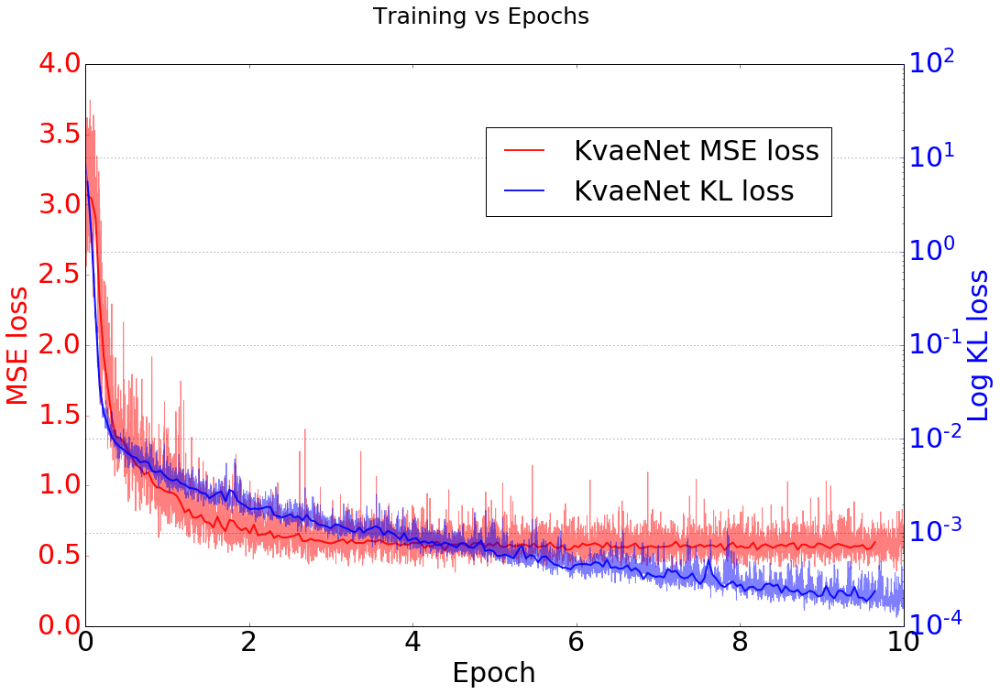

In [34]:
# Using the absolute path
run_id = "20190627_173524"
model_name = "KvaeNet"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

# Setup the path to the training log file
training_log = dump_dir + "log_train.csv"

# Plot using the downsample intervals
plot_utils.plot_vae_training([training_log], [model_name], {model_name:["red", "blue"]},
                         downsample_interval=32, show_plot=True, legend_loc=(0.8,0.8))

In [35]:
np_arr_path = dump_dir + "iteration_1999.npz"

# Load the numpy array
np_arr = np.load(np_arr_path)
np_event = np_arr["events"]
np_recon = np_arr["recons"]
np_labels = np_arr["labels"]
np_energies = np_arr["energies"]

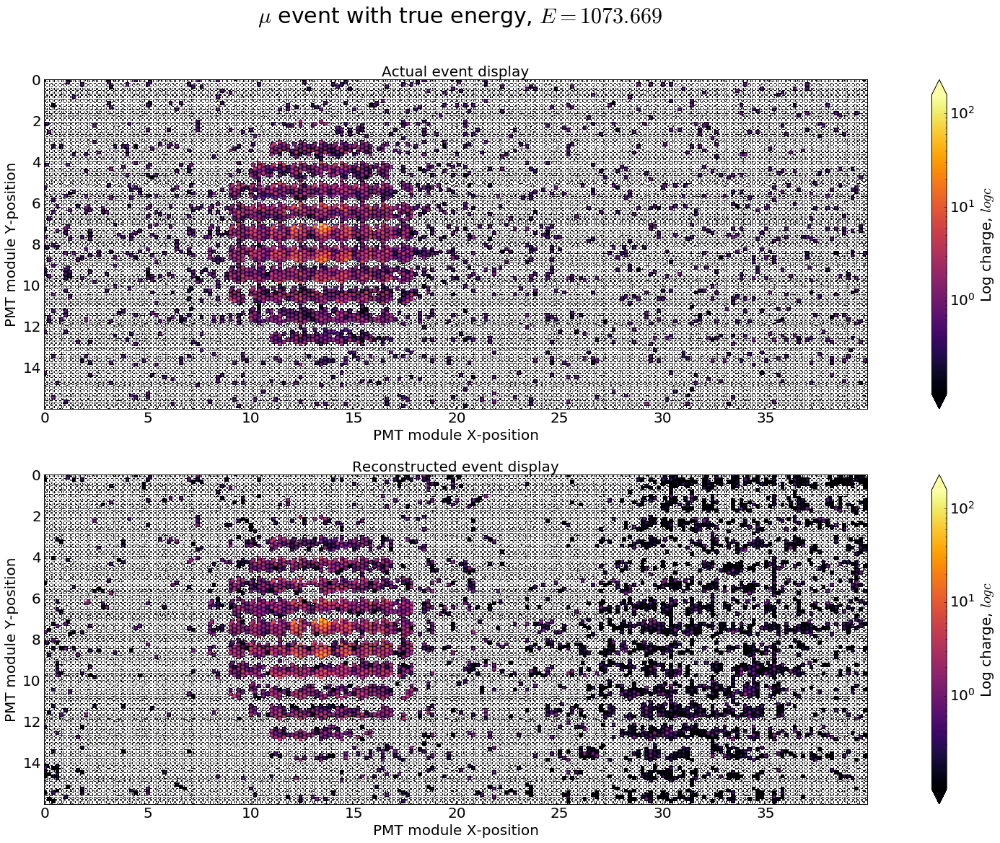

In [23]:
i = random.randint(0, np_labels.shape[0]-1)
plot_utils.plot_actual_vs_recon(np_event[i], np_recon[i], 
                                label_dict[np_labels[i]], np_energies[i].item(),
                                show_plot=True)

In [36]:
np_arr_path = dump_dir + "iteration_5999.npz"

# Load the numpy array
np_arr = np.load(np_arr_path)
np_event = np_arr["events"]
np_recon = np_arr["recons"]
np_labels = np_arr["labels"]
np_energies = np_arr["energies"]

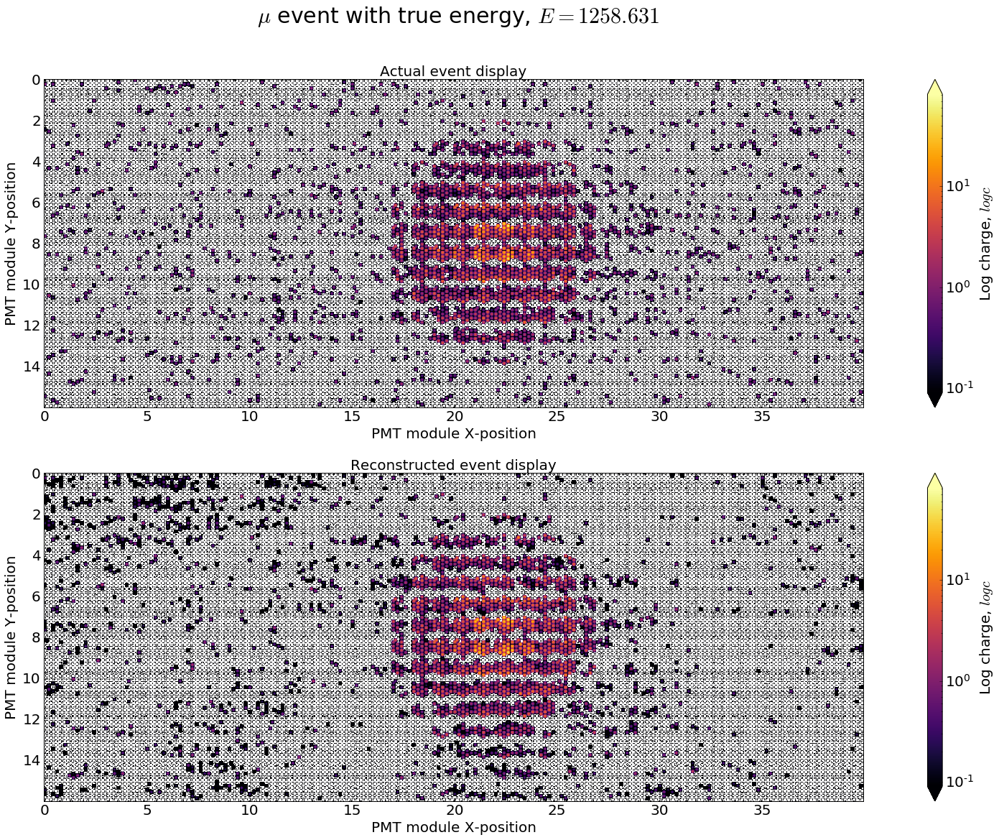

In [25]:
i = random.randint(0, np_labels.shape[0]-1)
plot_utils.plot_actual_vs_recon(np_event[i], np_recon[i], 
                                label_dict[np_labels[i]], np_energies[i].item(),
                                show_plot=True)

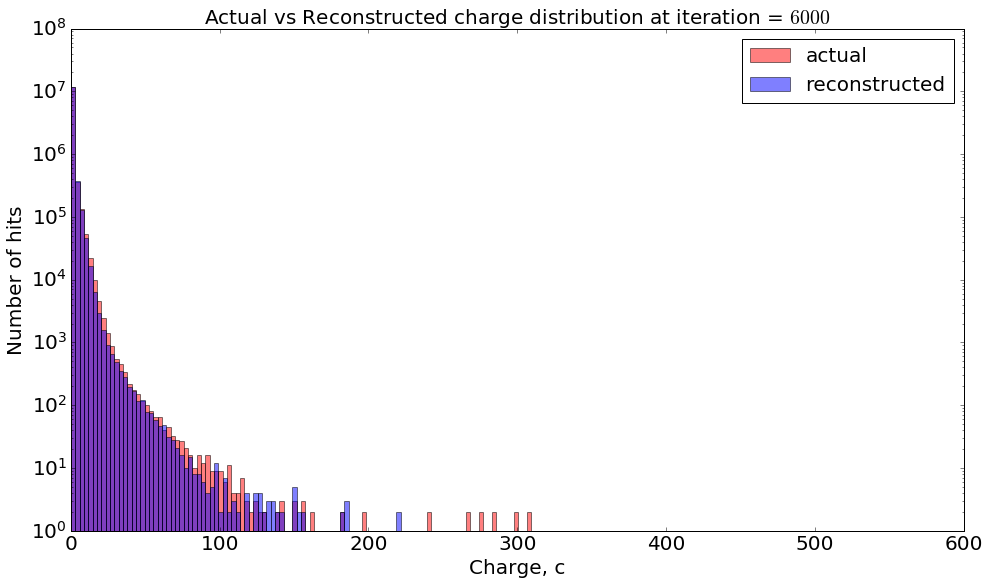

In [37]:
plot_charge_hist(torch.tensor(np_event).permute(0,2,3,1).numpy(),
                 np_recon, 6000, num_bins=200)

## ConvtwovaeNet architecture

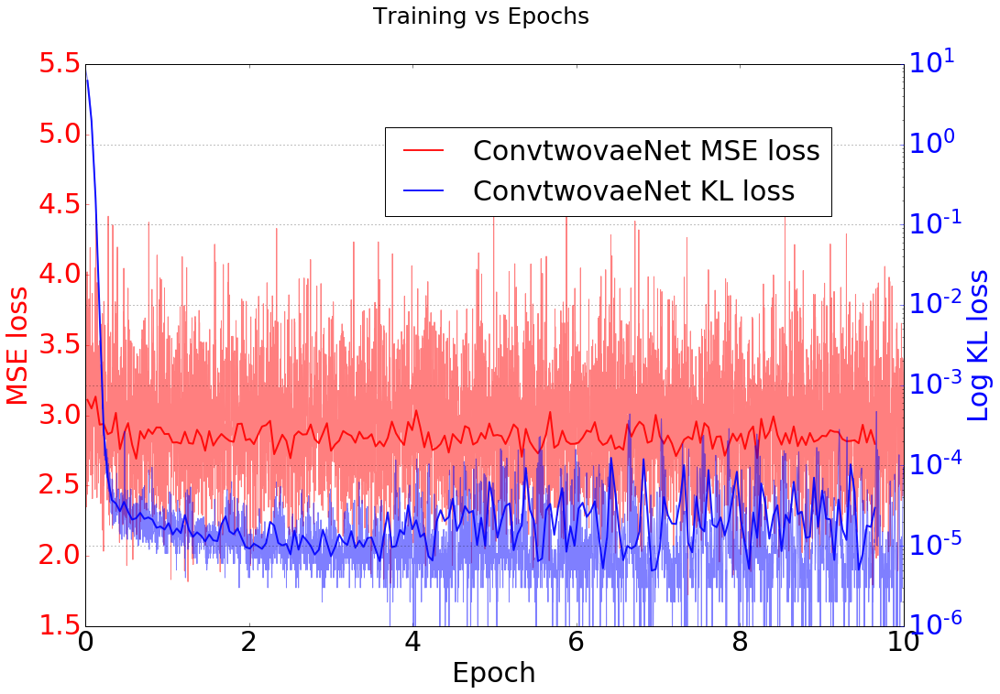

In [40]:
# Using the absolute path
run_id = "20190627_175612"
model_name = "ConvtwovaeNet"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

# Setup the path to the training log file
training_log = dump_dir + "log_train.csv"

# Plot using the downsample intervals
plot_utils.plot_vae_training([training_log], [model_name], {model_name:["red", "blue"]},
                         downsample_interval=32, show_plot=True, legend_loc=(0.8,0.8))

In [41]:
np_arr_path = dump_dir + "iteration_5999.npz"

# Load the numpy array
np_arr = np.load(np_arr_path)
np_event = np_arr["events"]
np_recon = np_arr["recons"]
np_labels = np_arr["labels"]
np_energies = np_arr["energies"]

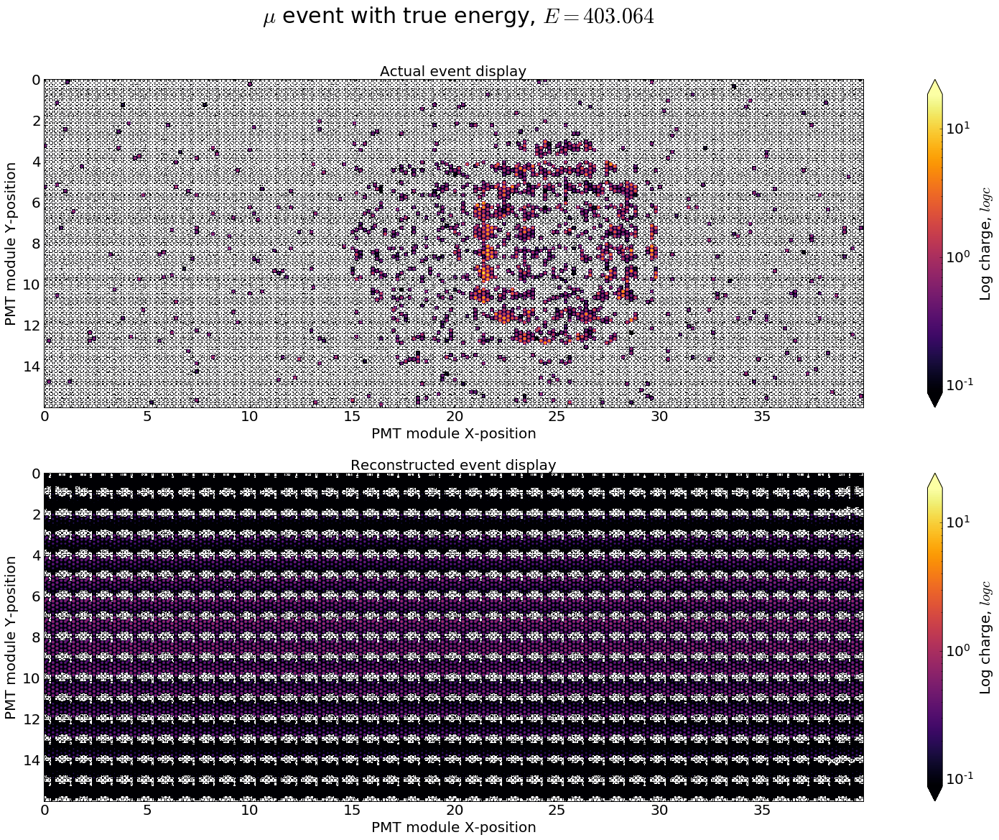

In [20]:
i = random.randint(0, np_labels.shape[0]-1)
plot_utils.plot_actual_vs_recon(np_event[i], np_recon[i], 
                                label_dict[np_labels[i]], np_energies[i].item(),
                                show_plot=True)

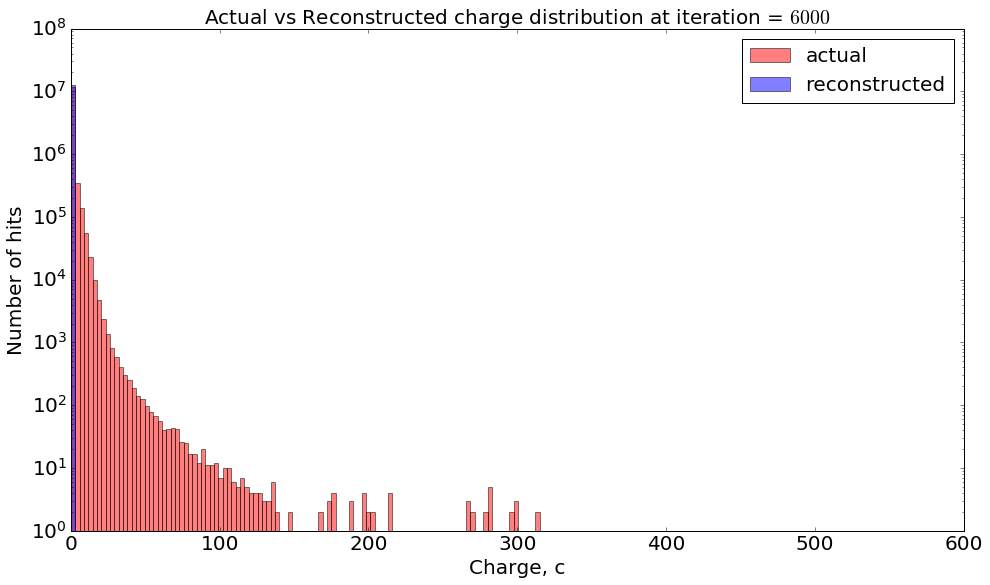

In [42]:
plot_charge_hist(torch.tensor(np_event).permute(0,2,3,1).numpy(),
                 np_recon, 6000, num_bins=200)

# KvaeNet with the same flattening procedure as ConvtwoNet

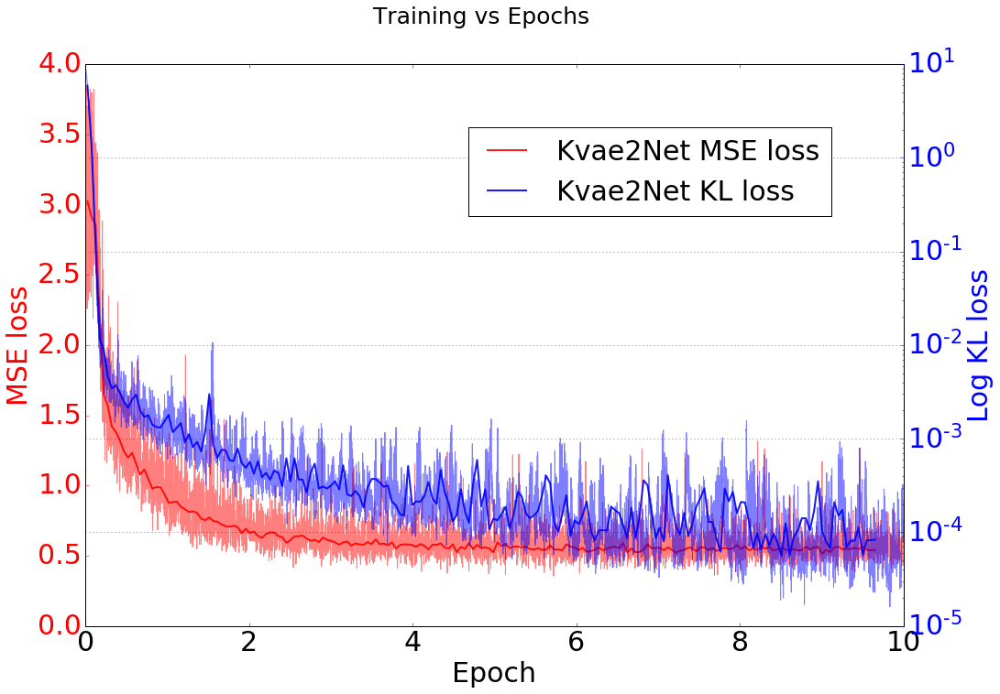

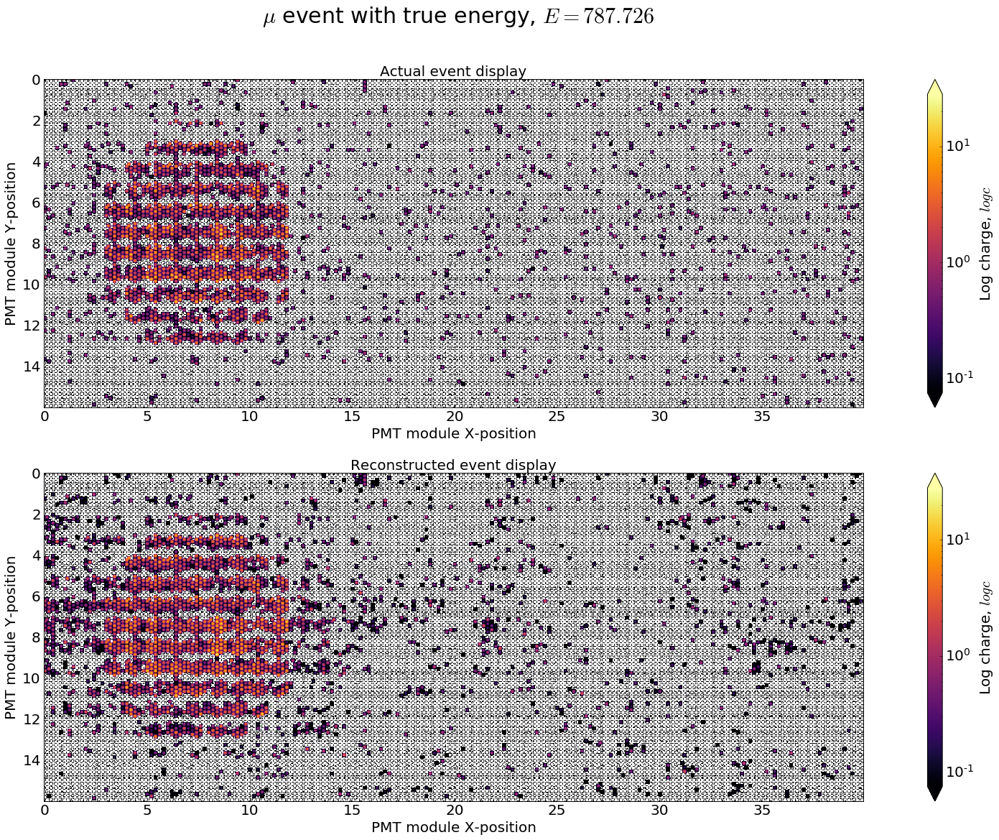

In [43]:
# Using the absolute path
run_id = "20190627_184929"
model_name = "Kvae2Net"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

# Setup the path to the training log file
training_log = dump_dir + "log_train.csv"

# Plot using the downsample intervals
plot_utils.plot_vae_training([training_log], [model_name], {model_name:["red", "blue"]},
                         downsample_interval=32, show_plot=True, legend_loc=(0.8,0.8))

np_arr_path = dump_dir + "iteration_5999.npz"

# Load the numpy array
np_arr = np.load(np_arr_path)
np_event, np_recon, np_labels, np_energies = np_arr["events"], np_arr["recons"], np_arr["labels"], np_arr["energies"]

i = random.randint(0, np_labels.shape[0]-1)
plot_utils.plot_actual_vs_recon(np_event[i], np_recon[i], 
                                label_dict[np_labels[i]], np_energies[i].item(),
                                show_plot=True)

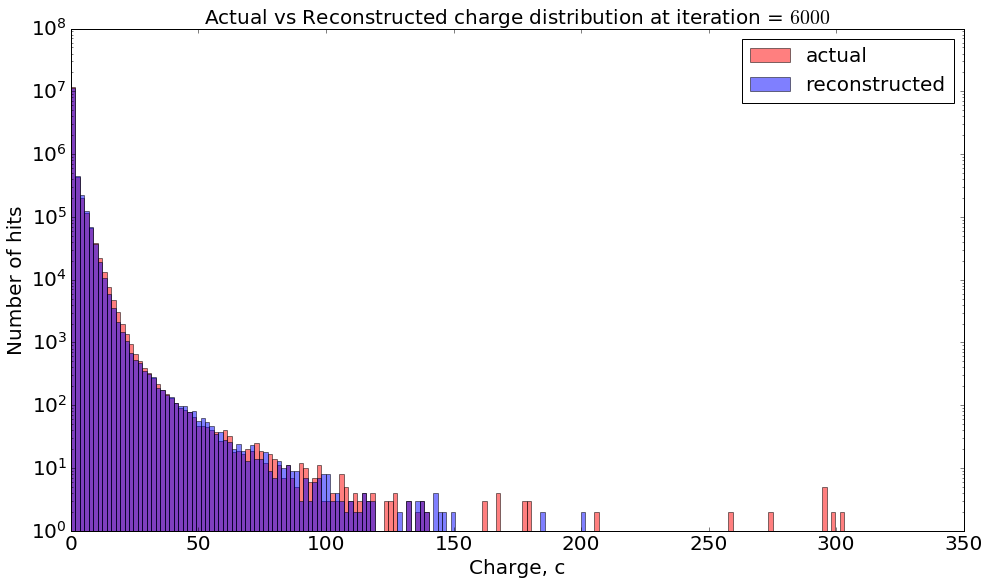

In [44]:
plot_charge_hist(torch.tensor(np_event).permute(0,2,3,1).numpy(),
                 np_recon, 6000, num_bins=200)

# KvaeNet with the first MaxPooling layer replaced by Convolutional layer

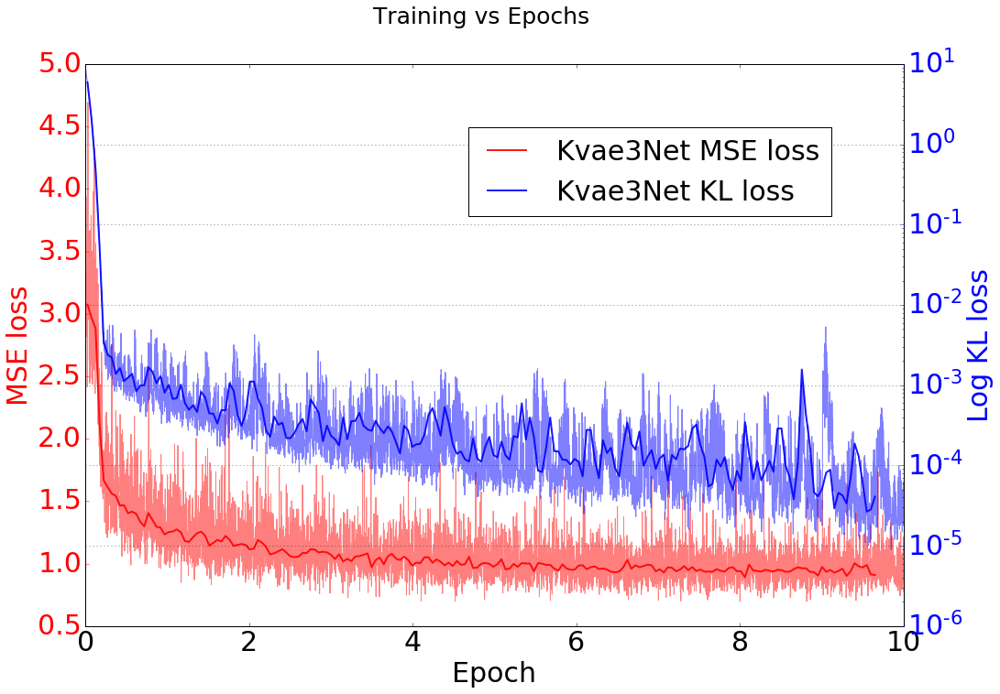

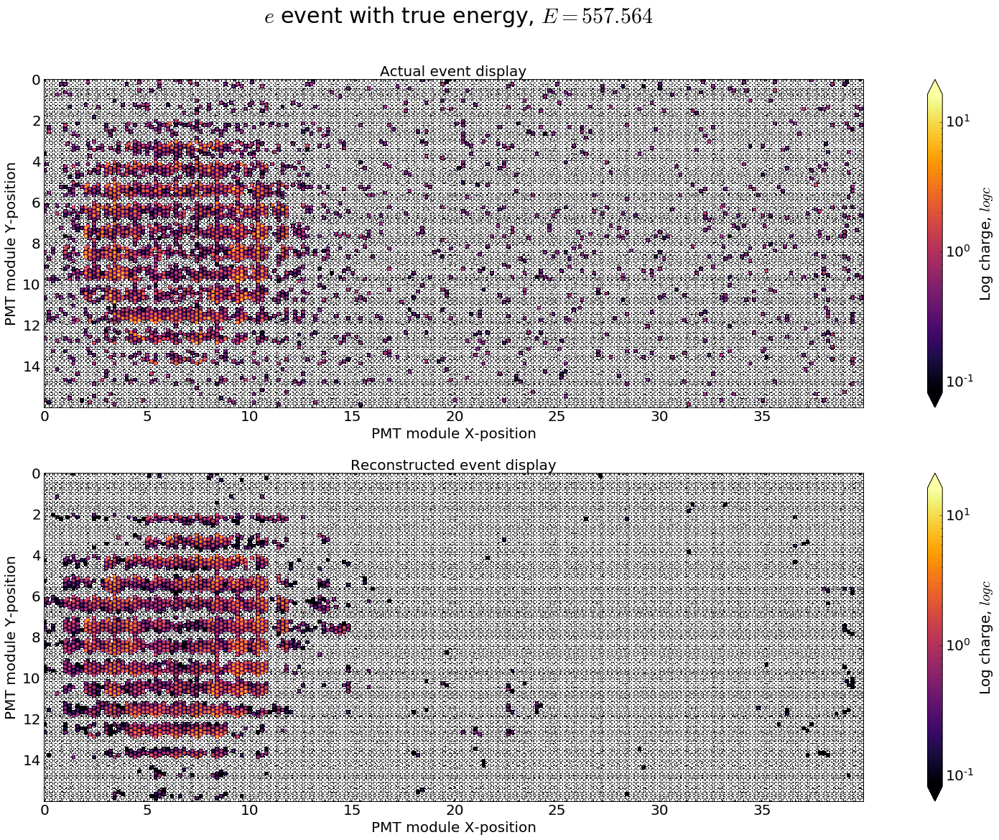

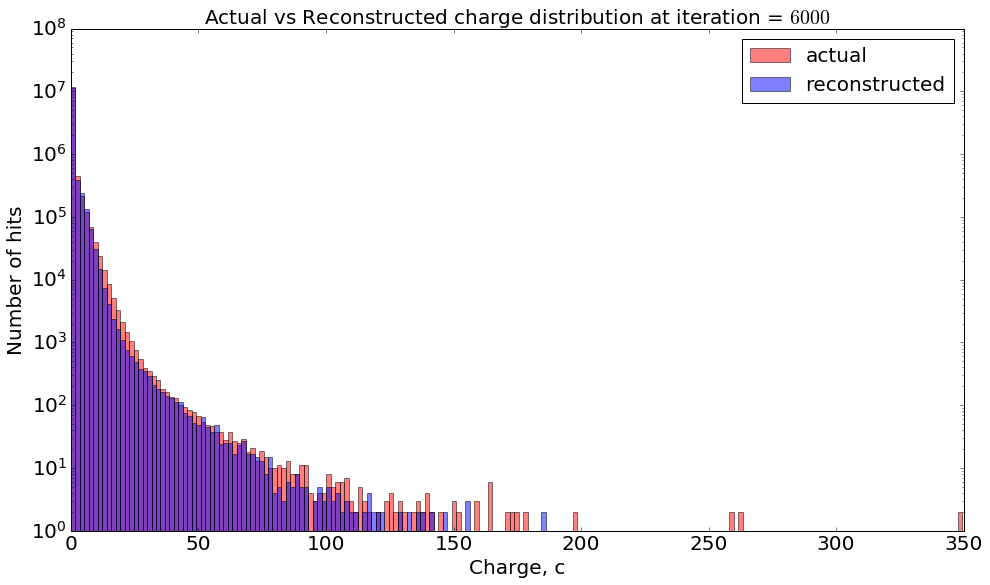

In [45]:
# Using the absolute path
run_id = "20190627_193510"
model_name = "Kvae3Net"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

# Setup the path to the training log file
training_log = dump_dir + "log_train.csv"

# Plot using the downsample intervals
plot_utils.plot_vae_training([training_log], [model_name], {model_name:["red", "blue"]},
                         downsample_interval=32, show_plot=True, legend_loc=(0.8,0.8))

np_arr_path = dump_dir + "iteration_5999.npz"

# Load the numpy array
np_arr = np.load(np_arr_path)
np_event, np_recon, np_labels, np_energies = np_arr["events"], np_arr["recons"], np_arr["labels"], np_arr["energies"]

i = random.randint(0, np_labels.shape[0]-1)
plot_utils.plot_actual_vs_recon(np_event[i], np_recon[i], 
                                label_dict[np_labels[i]], np_energies[i].item(),
                                show_plot=True)

plot_charge_hist(torch.tensor(np_event).permute(0,2,3,1).numpy(),
                 np_recon, 6000, num_bins=200)

# KvaeNet with the second MaxPooling layer replaced by Convolutional layer

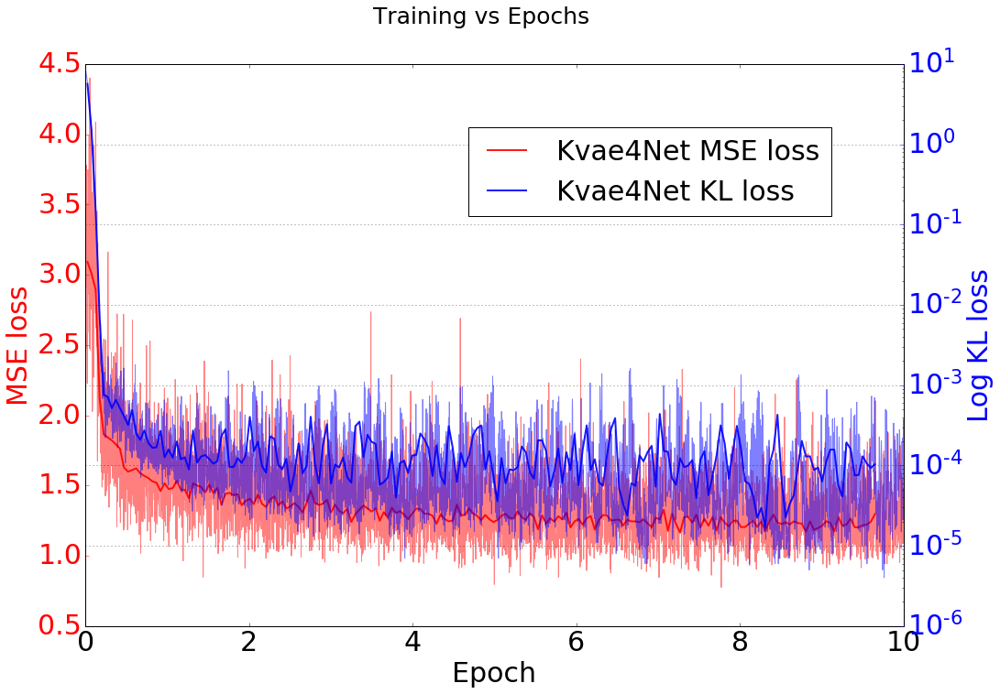

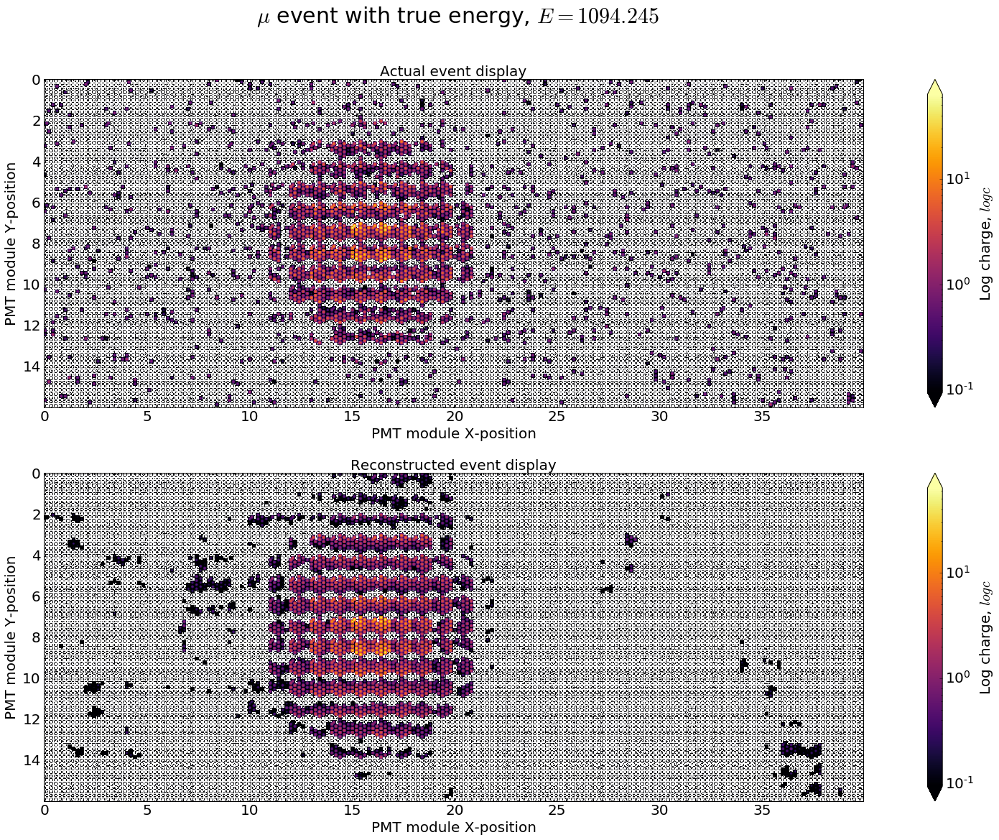

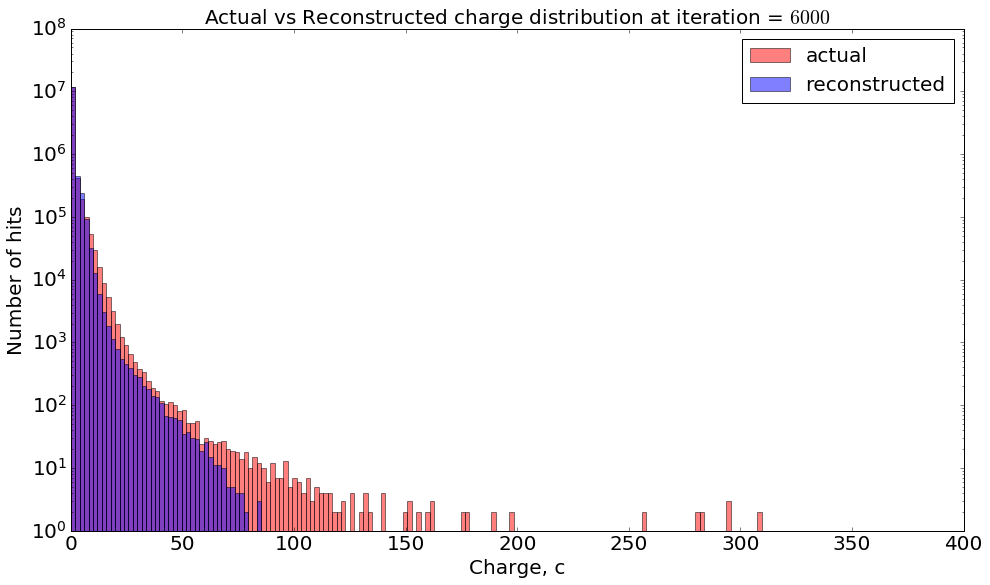

In [46]:
# Using the absolute path
run_id = "20190627_194620"
model_name = "Kvae4Net"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

# Setup the path to the training log file
training_log = dump_dir + "log_train.csv"

# Plot using the downsample intervals
plot_utils.plot_vae_training([training_log], [model_name], {model_name:["red", "blue"]},
                         downsample_interval=32, show_plot=True, legend_loc=(0.8,0.8))

np_arr_path = dump_dir + "iteration_5999.npz"

# Load the numpy array
np_arr = np.load(np_arr_path)
np_event, np_recon, np_labels, np_energies = np_arr["events"], np_arr["recons"], np_arr["labels"], np_arr["energies"]

i = random.randint(0, np_labels.shape[0]-1)
plot_utils.plot_actual_vs_recon(np_event[i], np_recon[i], 
                                label_dict[np_labels[i]], np_energies[i].item(),
                                show_plot=True)

plot_charge_hist(torch.tensor(np_event).permute(0,2,3,1).numpy(),
                 np_recon, 6000, num_bins=200)

# KvaeNet with the third MaxPooling layer replaced by Convolutional layer

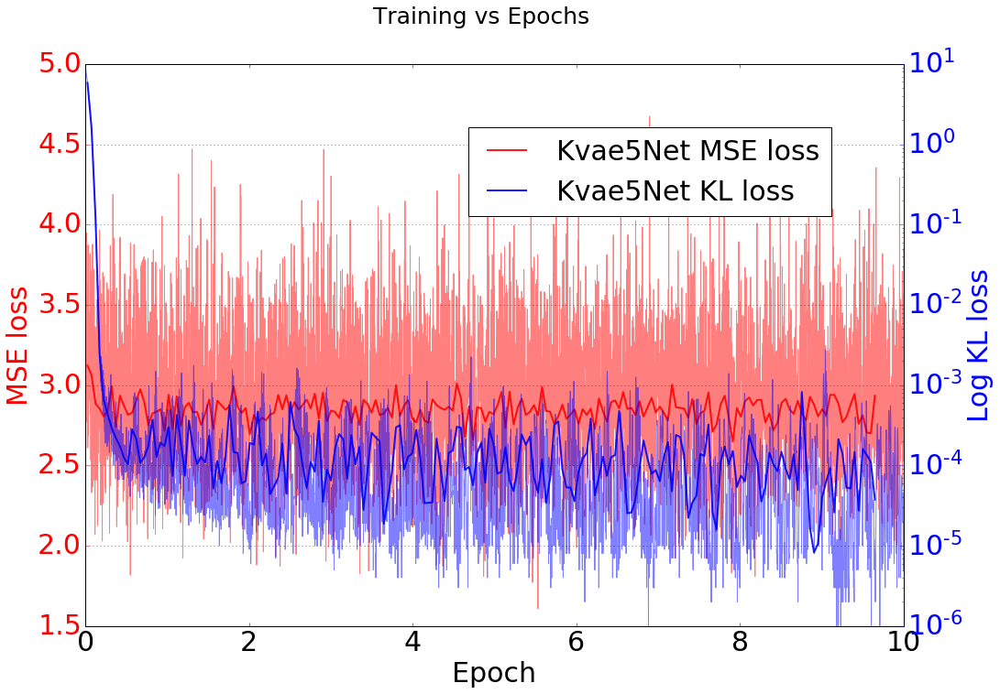

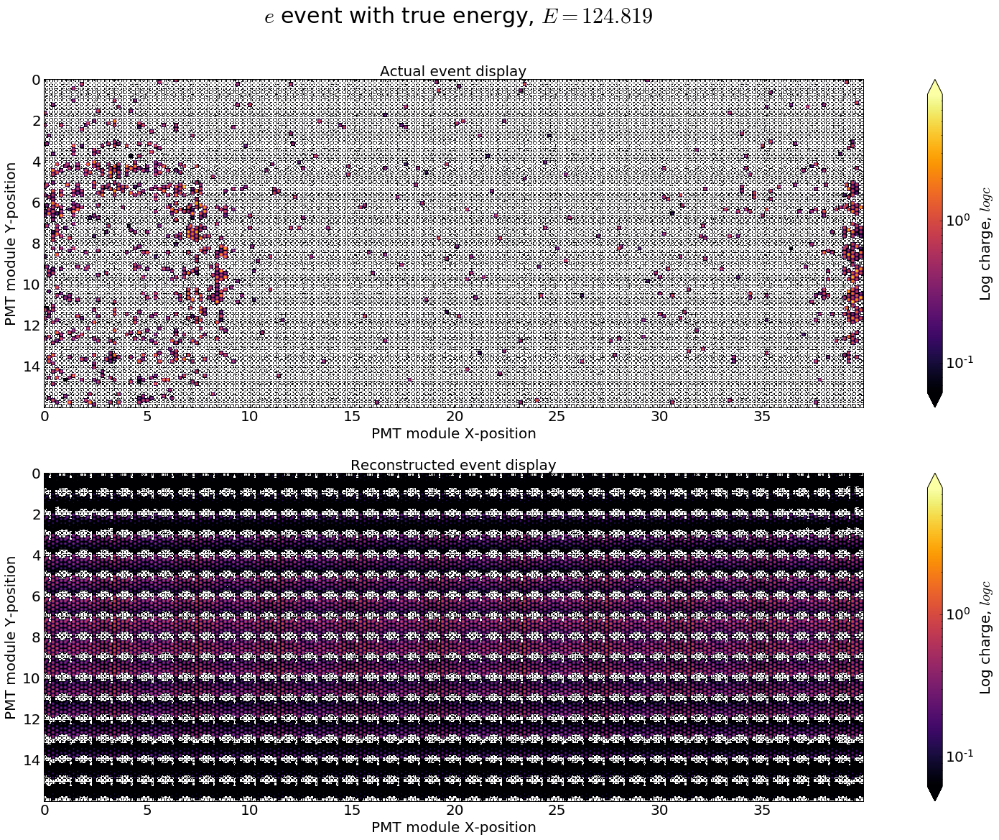

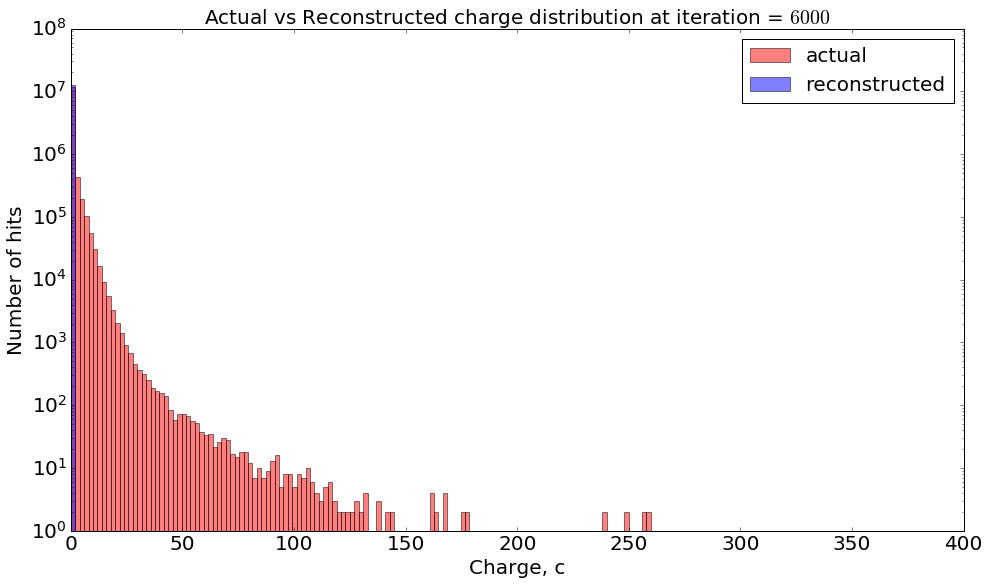

In [48]:
# Using the absolute path
run_id = "20190627_200453"
model_name = "Kvae5Net"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

# Setup the path to the training log file
training_log = dump_dir + "log_train.csv"

# Plot using the downsample intervals
plot_utils.plot_vae_training([training_log], [model_name], {model_name:["red", "blue"]},
                         downsample_interval=32, show_plot=True, legend_loc=(0.8,0.8))

np_arr_path = dump_dir + "iteration_5999.npz"

# Load the numpy array
np_arr = np.load(np_arr_path)
np_event, np_recon, np_labels, np_energies = np_arr["events"], np_arr["recons"], np_arr["labels"], np_arr["energies"]

i = random.randint(0, np_labels.shape[0]-1)
plot_utils.plot_actual_vs_recon(np_event[i], np_recon[i], 
                                label_dict[np_labels[i]], np_energies[i].item(),
                                show_plot=True)

plot_charge_hist(torch.tensor(np_event).permute(0,2,3,1).numpy(),
                 np_recon, 6000, num_bins=200)

# KvaeNet with only the third MaxPooling layer replaced by Convolutional layer

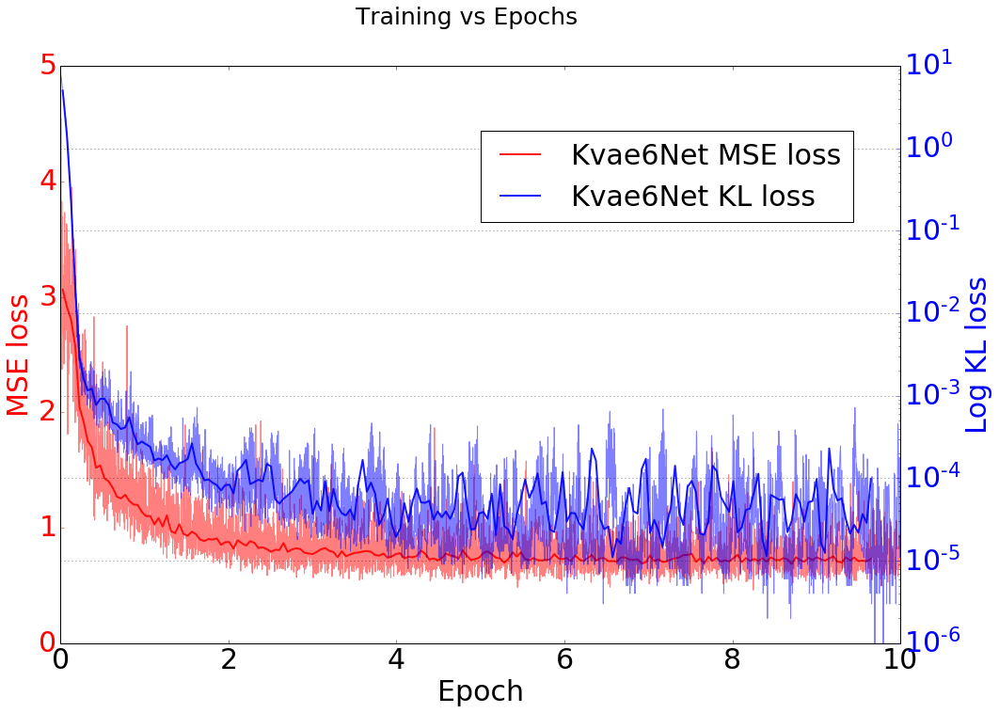

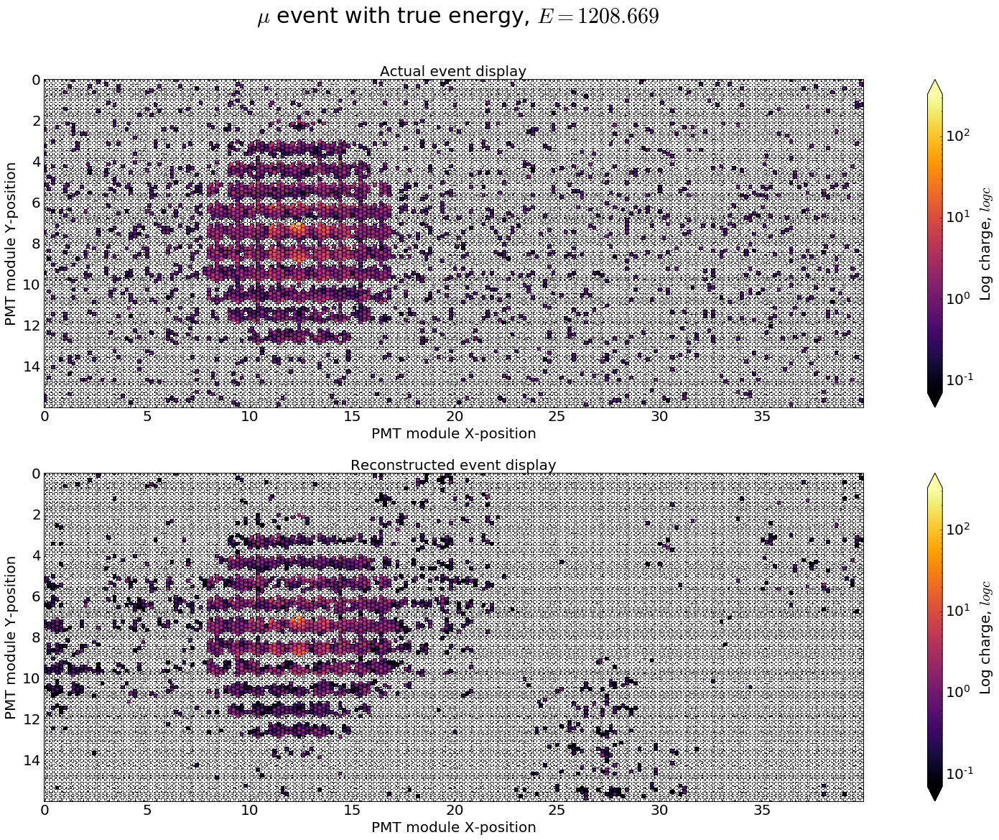

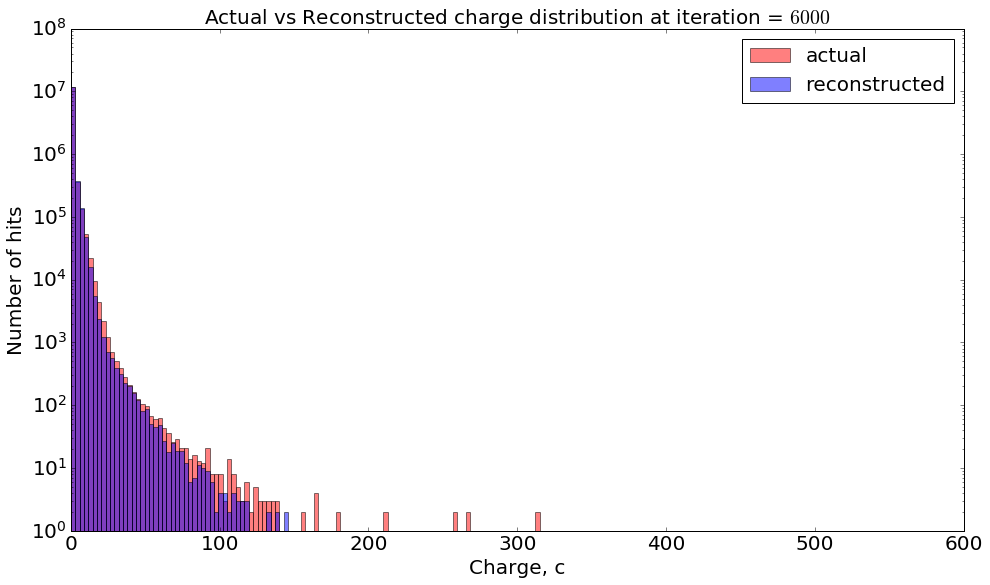

In [49]:
# Using the absolute path
run_id = "20190627_202916"
model_name = "Kvae6Net"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

# Setup the path to the training log file
training_log = dump_dir + "log_train.csv"

# Plot using the downsample intervals
plot_utils.plot_vae_training([training_log], [model_name], {model_name:["red", "blue"]},
                         downsample_interval=32, show_plot=True, legend_loc=(0.8,0.8))

np_arr_path = dump_dir + "iteration_5999.npz"

# Load the numpy array
np_arr = np.load(np_arr_path)
np_event, np_recon, np_labels, np_energies = np_arr["events"], np_arr["recons"], np_arr["labels"], np_arr["energies"]

i = random.randint(0, np_labels.shape[0]-1)
plot_utils.plot_actual_vs_recon(np_event[i], np_recon[i], 
                                label_dict[np_labels[i]], np_energies[i].item(),
                                show_plot=True)

plot_charge_hist(torch.tensor(np_event).permute(0,2,3,1).numpy(),
                 np_recon, 6000, num_bins=200)

# Phase 2 testing

# Testing the influence of the grouping on the convolutions

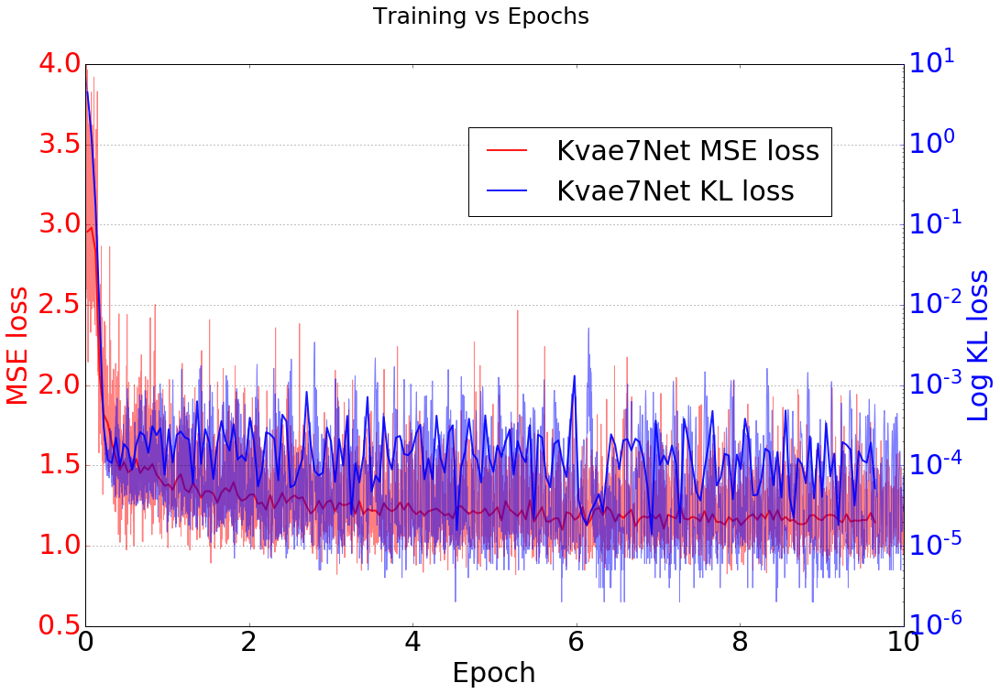

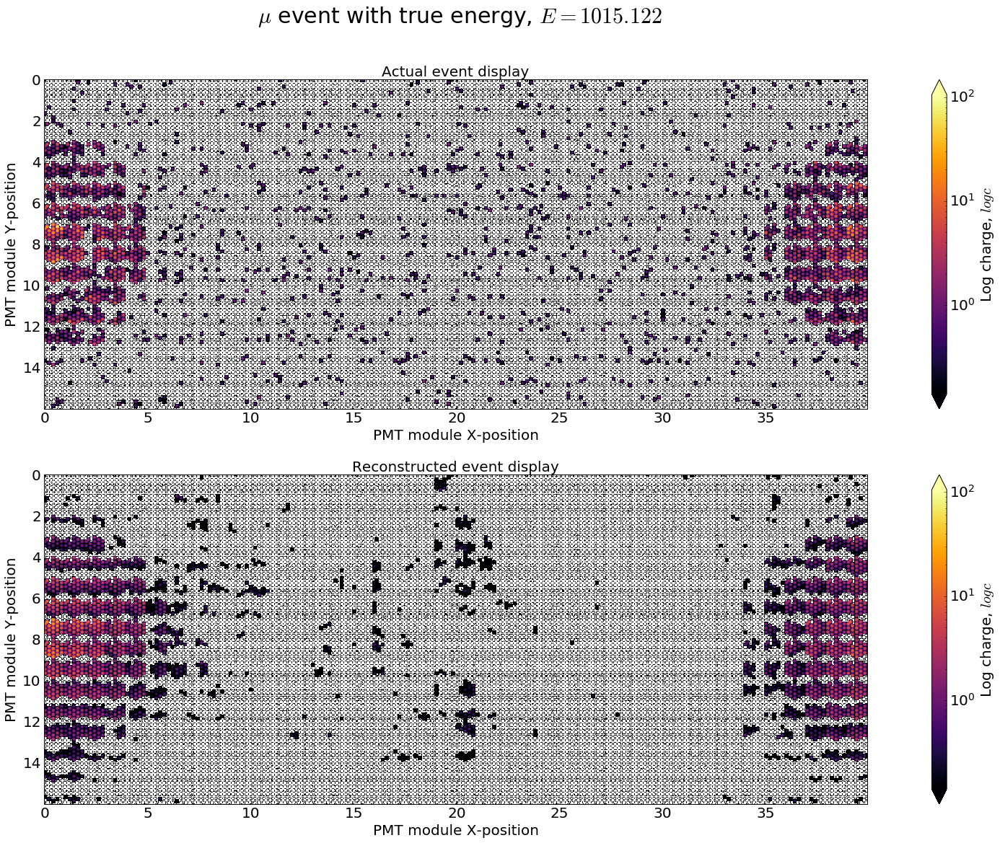

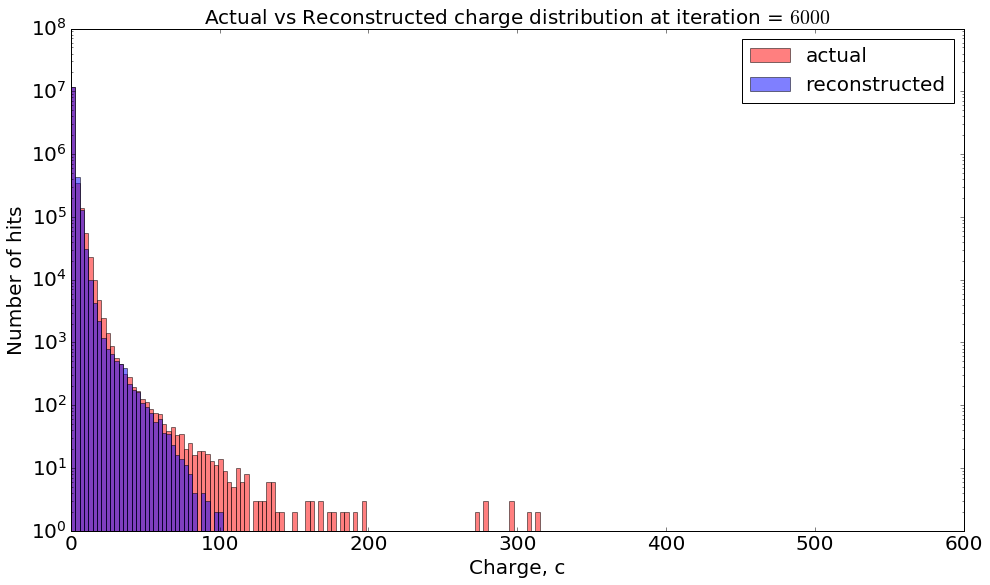

In [50]:
# Using the absolute path
run_id = "20190627_215206"
model_name = "Kvae7Net"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

# Setup the path to the training log file
training_log = dump_dir + "log_train.csv"

# Plot using the downsample intervals
plot_utils.plot_vae_training([training_log], [model_name], {model_name:["red", "blue"]},
                         downsample_interval=32, show_plot=True, legend_loc=(0.8,0.8))

np_arr_path = dump_dir + "iteration_5999.npz"

# Load the numpy array
np_arr = np.load(np_arr_path)
np_event, np_recon, np_labels, np_energies = np_arr["events"], np_arr["recons"], np_arr["labels"], np_arr["energies"]

i = random.randint(0, np_labels.shape[0]-1)
plot_utils.plot_actual_vs_recon(np_event[i], np_recon[i], 
                                label_dict[np_labels[i]], np_energies[i].item(),
                                show_plot=True)

plot_charge_hist(torch.tensor(np_event).permute(0,2,3,1).numpy(),
                 np_recon, 6000, num_bins=200)

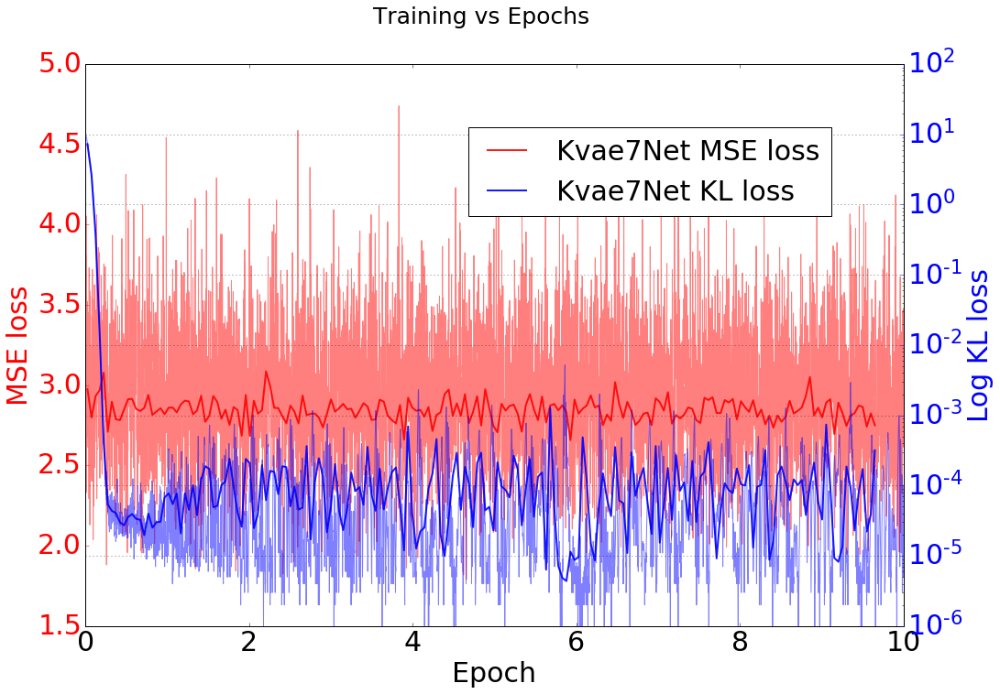

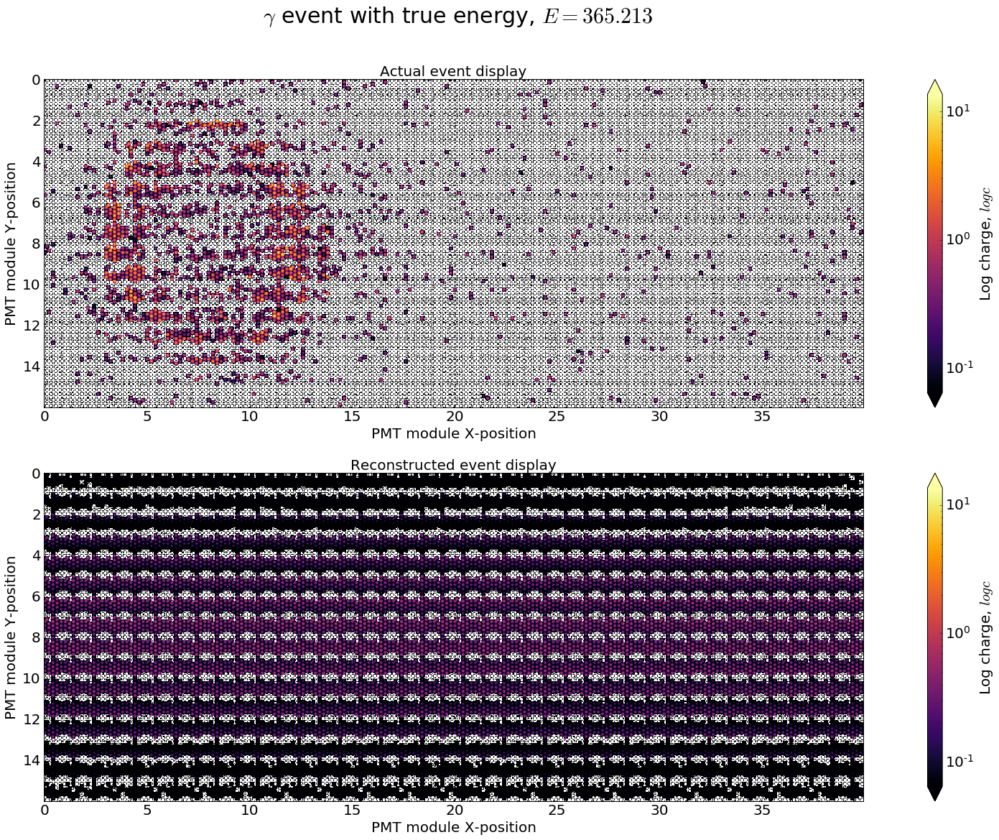

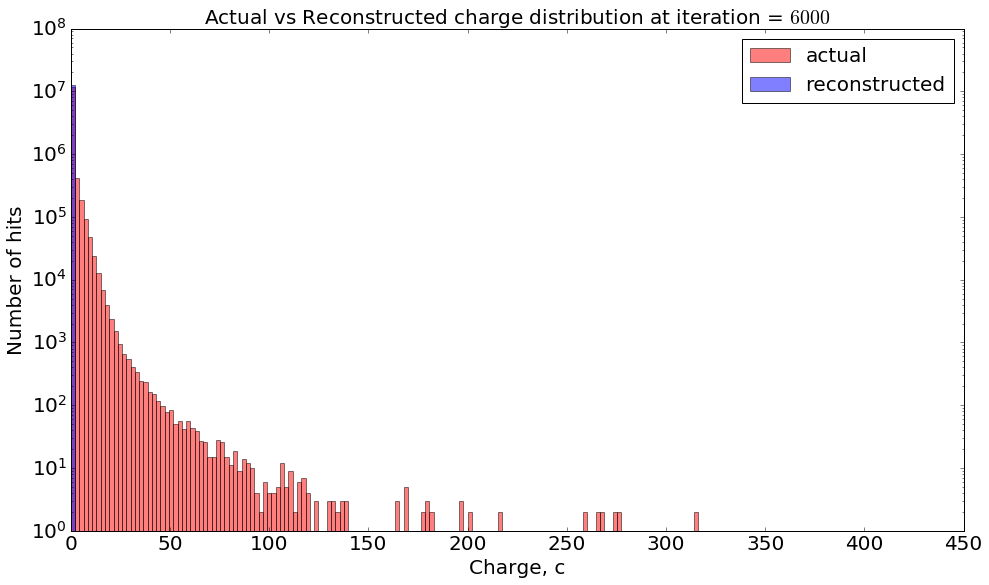

In [51]:
# Using the absolute path
run_id = "20190627_220650"
model_name = "Kvae7Net"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

# Setup the path to the training log file
training_log = dump_dir + "log_train.csv"

# Plot using the downsample intervals
plot_utils.plot_vae_training([training_log], [model_name], {model_name:["red", "blue"]},
                         downsample_interval=32, show_plot=True, legend_loc=(0.8,0.8))

np_arr_path = dump_dir + "iteration_5999.npz"

# Load the numpy array
np_arr = np.load(np_arr_path)
np_event, np_recon, np_labels, np_energies = np_arr["events"], np_arr["recons"], np_arr["labels"], np_arr["energies"]

i = random.randint(0, np_labels.shape[0]-1)
plot_utils.plot_actual_vs_recon(np_event[i], np_recon[i], 
                                label_dict[np_labels[i]], np_energies[i].item(),
                                show_plot=True)

plot_charge_hist(torch.tensor(np_event).permute(0,2,3,1).numpy(),
                 np_recon, 6000, num_bins=200)

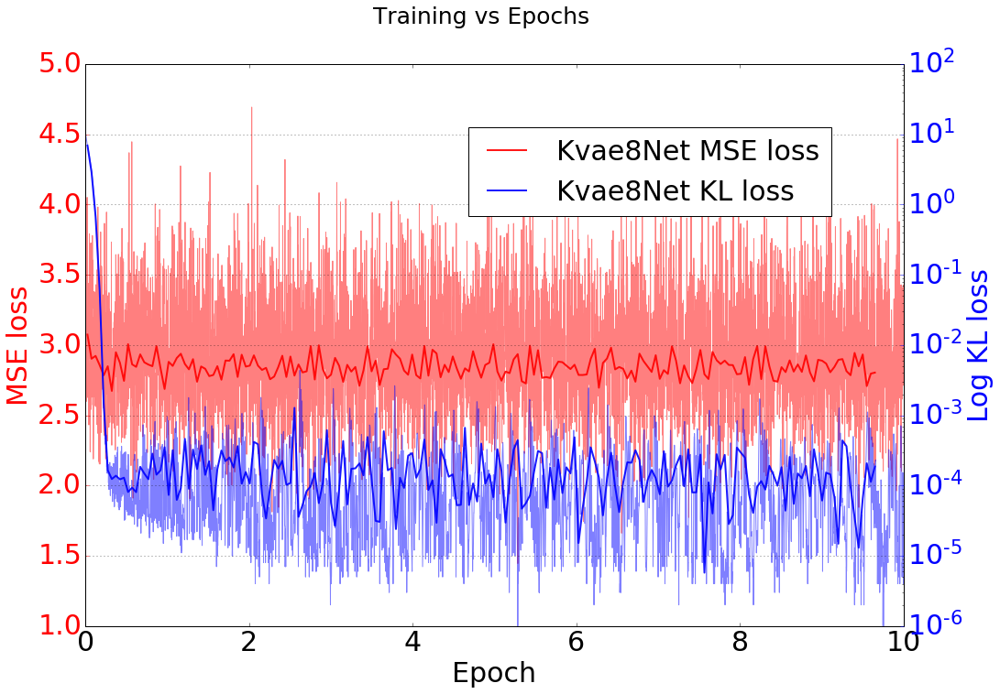

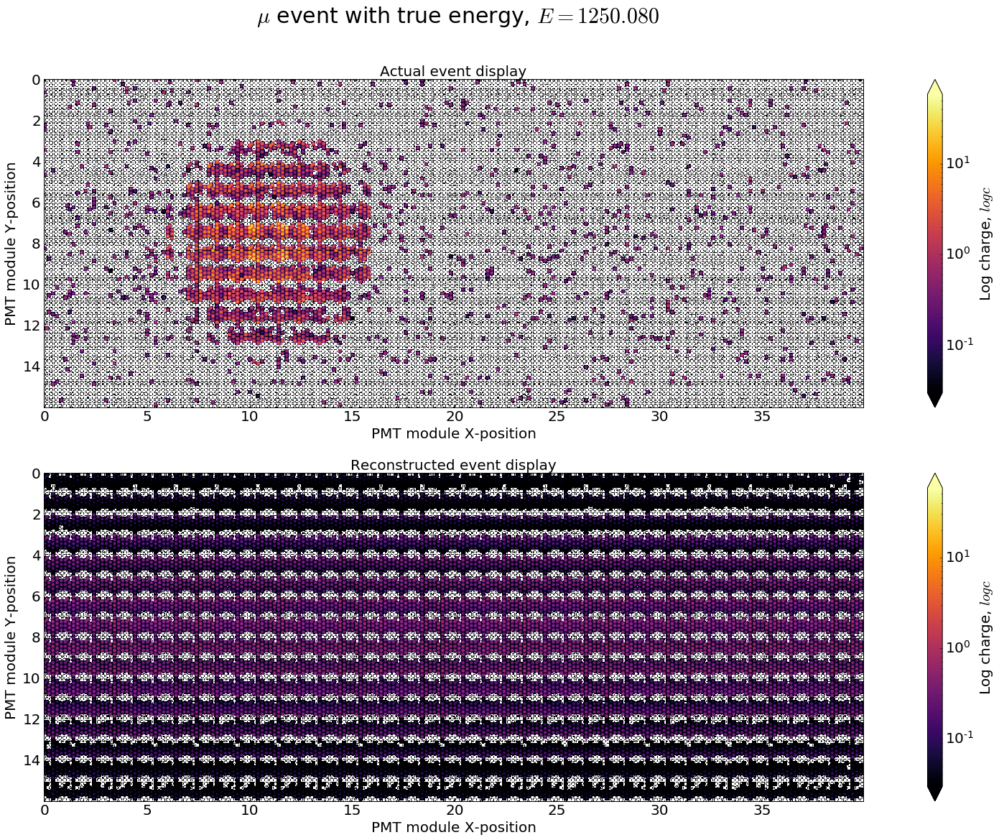

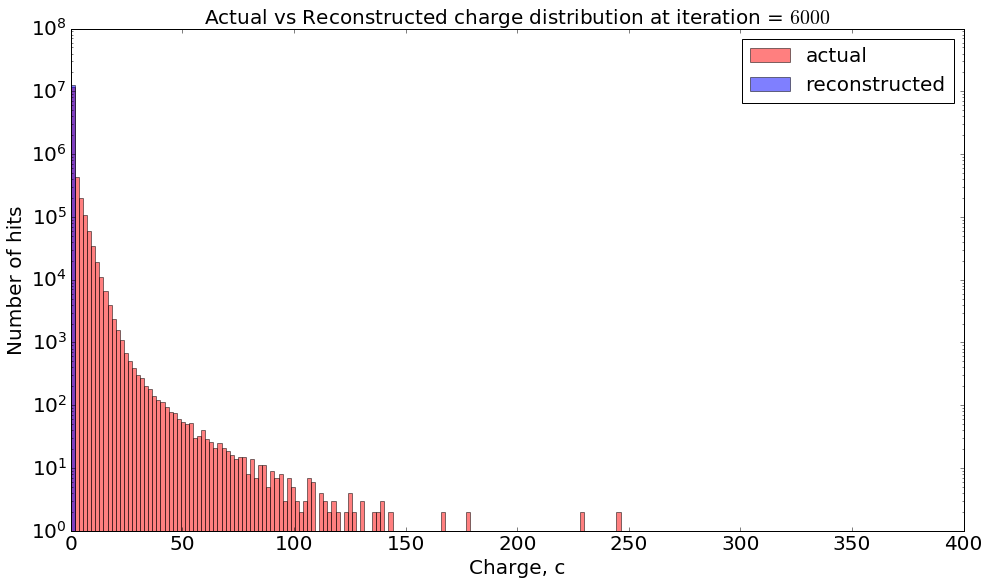

In [52]:
# Using the absolute path
run_id = "20190628_004637"
model_name = "Kvae8Net"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

# Setup the path to the training log file
training_log = dump_dir + "log_train.csv"

# Plot using the downsample intervals
plot_utils.plot_vae_training([training_log], [model_name], {model_name:["red", "blue"]},
                         downsample_interval=32, show_plot=True, legend_loc=(0.8,0.8))

np_arr_path = dump_dir + "iteration_5999.npz"

# Load the numpy array
np_arr = np.load(np_arr_path)
np_event, np_recon, np_labels, np_energies = np_arr["events"], np_arr["recons"], np_arr["labels"], np_arr["energies"]

i = random.randint(0, np_labels.shape[0]-1)
plot_utils.plot_actual_vs_recon(np_event[i], np_recon[i], 
                                label_dict[np_labels[i]], np_energies[i].item(),
                                show_plot=True)

plot_charge_hist(torch.tensor(np_event).permute(0,2,3,1).numpy(),
                 np_recon, 6000, num_bins=200)

# Test the sampling method

In [53]:
# Using the absolute path
run_id = "20190628_012940"
model_name = "Kvae8Net"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/samples/KvaeNet_0"

In [54]:
samples = np.load(dump_dir + "/10_samples.npy")

In [55]:
print(samples.shape)

(10,)


In [56]:
print(samples[0].shape)

torch.Size([4, 19, 16, 40])


# KvaeNet trained for 20.0 epochs using only one maxpooling layer

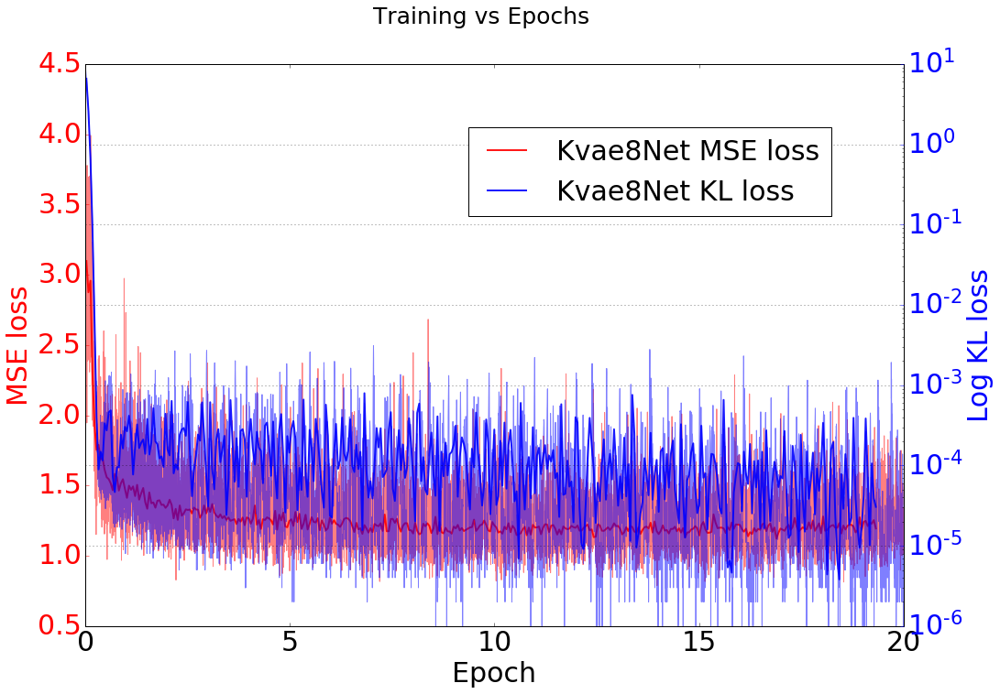

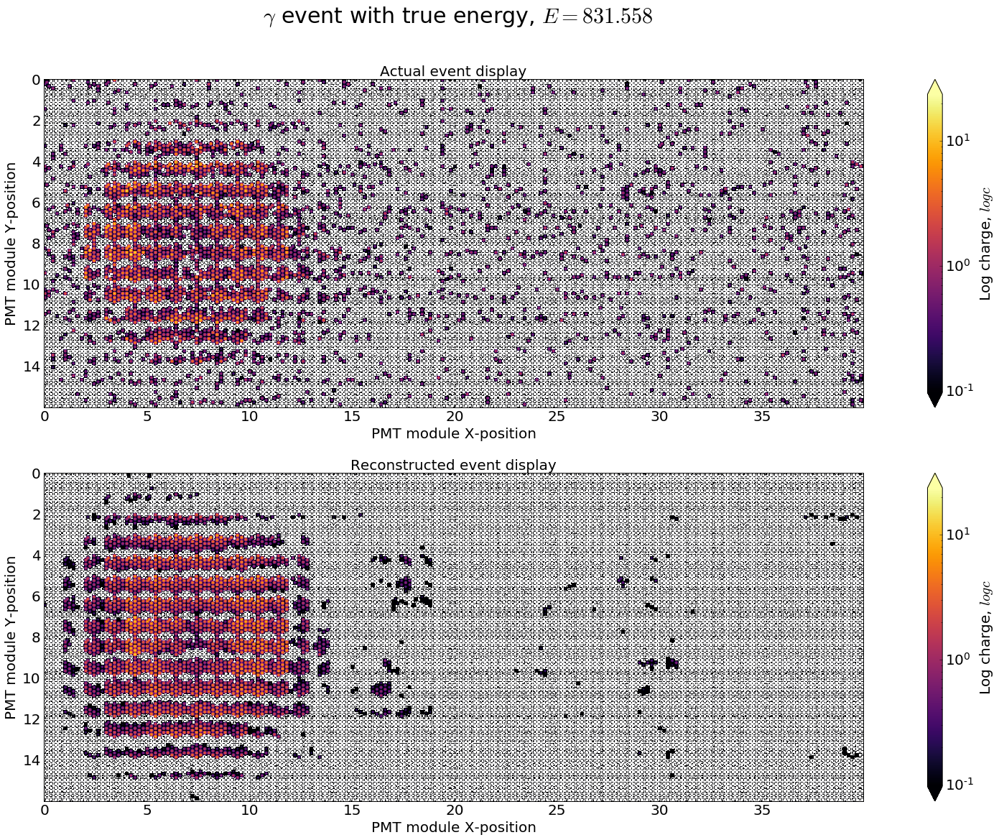

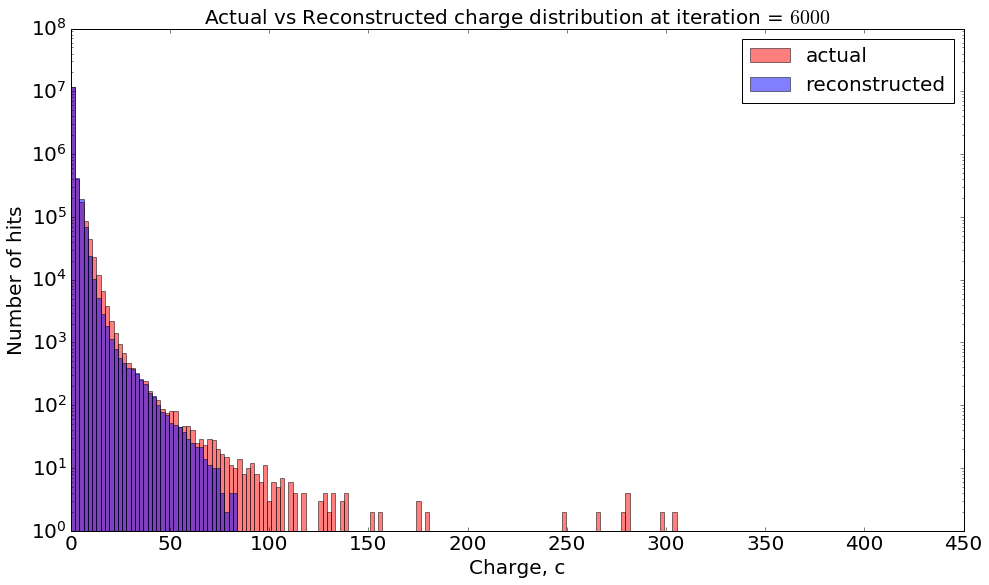

In [57]:
# Using the absolute path
run_id = "20190628_013427"
model_name = "Kvae8Net"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

# Setup the path to the training log file
training_log = dump_dir + "log_train.csv"

# Plot using the downsample intervals
plot_utils.plot_vae_training([training_log], [model_name], {model_name:["red", "blue"]},
                         downsample_interval=32, show_plot=True, legend_loc=(0.8,0.8))

np_arr_path = dump_dir + "iteration_5999.npz"

# Load the numpy array
np_arr = np.load(np_arr_path)
np_event, np_recon, np_labels, np_energies = np_arr["events"], np_arr["recons"], np_arr["labels"], np_arr["energies"]

i = random.randint(0, np_labels.shape[0]-1)
plot_utils.plot_actual_vs_recon(np_event[i], np_recon[i], 
                                label_dict[np_labels[i]], np_energies[i].item(),
                                show_plot=True)

plot_charge_hist(torch.tensor(np_event).permute(0,2,3,1).numpy(),
                 np_recon, 6000, num_bins=200)

In [60]:
sample_dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/samples/KvaeNet_0"
samples = np.load(sample_dump_dir + "/10_samples.npy")

In [61]:
print(samples.shape)

(10,)


In [64]:
print(samples[0][0].shape)

torch.Size([19, 16, 40])


In [70]:
print(samples[0][0].permute(1,2,0))

tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.

In [69]:
print(np_event[0].shape)

(16, 40, 19)


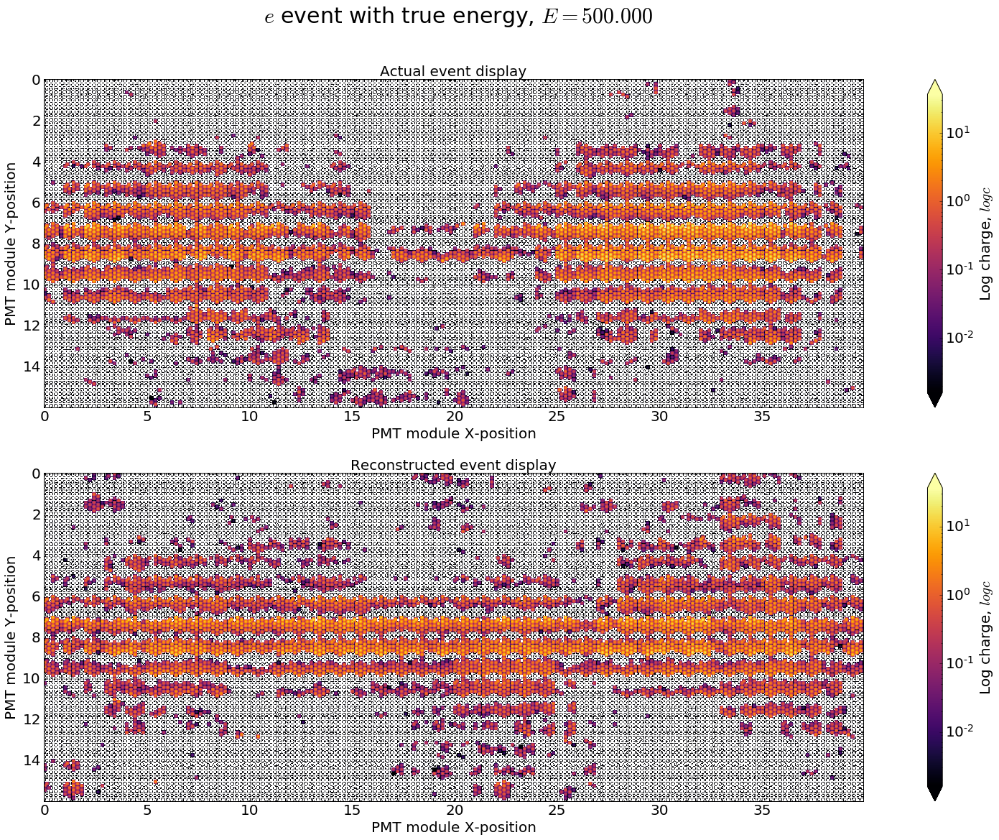

In [72]:
plot_utils.plot_actual_vs_recon(samples[0][0].permute(1,2,0).cpu().detach().numpy(),
                                samples[0][1].permute(1,2,0).cpu().detach().numpy(), 
                                "e", 500,
                                show_plot=True)

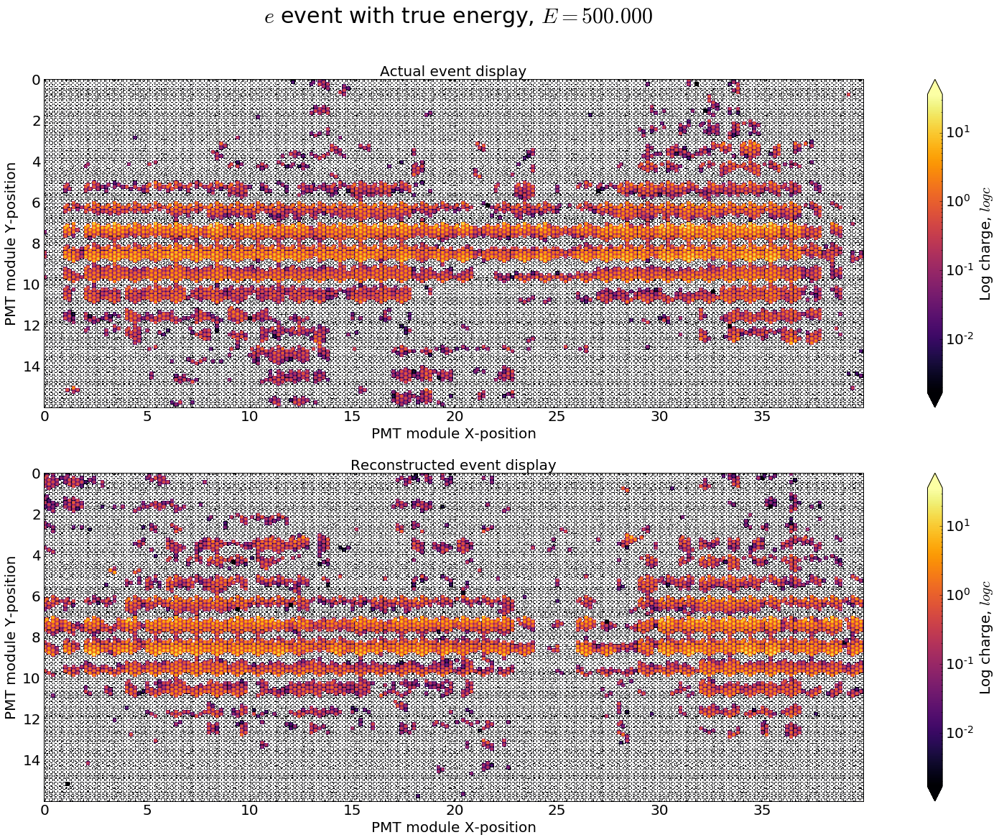

In [74]:
plot_utils.plot_actual_vs_recon(samples[0][2].permute(1,2,0).cpu().detach().numpy(),
                                samples[0][3].permute(1,2,0).cpu().detach().numpy(), 
                                "e", 500,
                                show_plot=True)